Name : Shubham Salunkhe

I have created this notebook after studying David Guevara's example. It was a great help in understanding these datasets and how to manipulate it according to different regions.

I have focused on India and its states of Maharashtra and Karnataka. My major observation is that in the western region of these states also known as Western Ghats, which is a World Bio-Diversity Hotspot majorly beacause of its evergreen vegatation, all 4 types of emmision scenarios depict a large loss in regions of "Tropical monsoon climate" and replaced by "Tropical Savana with dry winter" and this type of climate won't be able to sustain the evergreen vegetation on which the bio-diversity of the region largely deppends. This is represented by the barplots of shift in climate. It is clearly seen thatthe areas of "Tropical Monsoon Climate" have been reduced to almost half by the end of centuary and have hit the lowest of around 1.25 million sq.kms in years of 2026-2050. Especially in Maharashtra, the climate of complete western ghats region is predicted to change. This may be due very high rates of urbanization and ever increasing suburbs of Mumbai City. 


I also observed that the "monsoon-influenced humid subtropical climate" in the northern part of the country, known as northern plains which is the basin of River Ganga and its tributaries, is drastically changing over the centuary. Historically this region had many forests but since agricultural revolution in country, the land in this region is used for extensive agriculture predominantly in states of Uttar Pradhesh and Biar; also mining activaties in Jharkhand can also be the reason.

In [1]:
# # install and import condalab, run twice.
# !pip install -q condacolab -q
# import condacolab
# condacolab.install()

# # install geopandas, this could take long
# !conda install geopandas
# import geopandas as gpd

In [2]:
import geopandas as gpd

In [3]:
# for download and decompress the dataset
import os, zipfile, glob, io, requests

# for SIG and spatial info management
from shapely.geometry import Polygon, shape

# for SIG and spatial visualization
import folium
from folium import Choropleth
from folium.plugins import HeatMap

# for dataframes and numerical info management
import numpy as np
import pandas as pd

# for plot and graphs
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore warning about missing/empty geometries
import warnings
warnings.filterwarnings('ignore', 'GeoSeries.notna', UserWarning)
plt.rcParams.update({'figure.max_open_warning': 0})

# for dependencies
%matplotlib inline

In [4]:
# fetching from the repo
#! wget https://www.naturalearthdata.com/http//www.naturalearthdata.com/download/110m/cultural/ne_110m_admin_0_countries.zip

# importing the data
world_df = gpd.read_file("ne_110m_admin_0_countries.zip")
world_df.to_crs(epsg=4326, inplace=True)

# also the dataset is huge (162 features), so it need cleaning.
world_df = world_df[['CONTINENT','NAME_LONG', 'POP_EST', 'POP_YEAR', 'geometry']]
world_df.columns = world_df.columns.str.lower()

# features for plot
world_df['centroid'] = world_df.geometry.centroid # adding centroid for plotting names in the map

C:\Users\shubh\AppData\Local\Temp\ipykernel_24280\3747730555.py:13: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  world_df['centroid'] = world_df.geometry.centroid # adding centroid for plotting names in the map


In [5]:
print(world_df.geometry)

0      MULTIPOLYGON (((180.00000 -16.06713, 180.00000...
1      POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...
2      POLYGON ((-8.66559 27.65643, -8.66512 27.58948...
3      MULTIPOLYGON (((-122.84000 49.00000, -122.9742...
4      MULTIPOLYGON (((-122.84000 49.00000, -120.0000...
                             ...                        
172    POLYGON ((18.82982 45.90887, 18.82984 45.90888...
173    POLYGON ((20.07070 42.58863, 19.80161 42.50009...
174    POLYGON ((20.59025 41.85541, 20.52295 42.21787...
175    POLYGON ((-61.68000 10.76000, -61.10500 10.890...
176    POLYGON ((30.83385 3.50917, 29.95350 4.17370, ...
Name: geometry, Length: 177, dtype: geometry


In [6]:
world_df.name_long

0                     Fiji
1                 Tanzania
2           Western Sahara
3                   Canada
4            United States
              ...         
172                 Serbia
173             Montenegro
174                 Kosovo
175    Trinidad and Tobago
176            South Sudan
Name: name_long, Length: 177, dtype: object

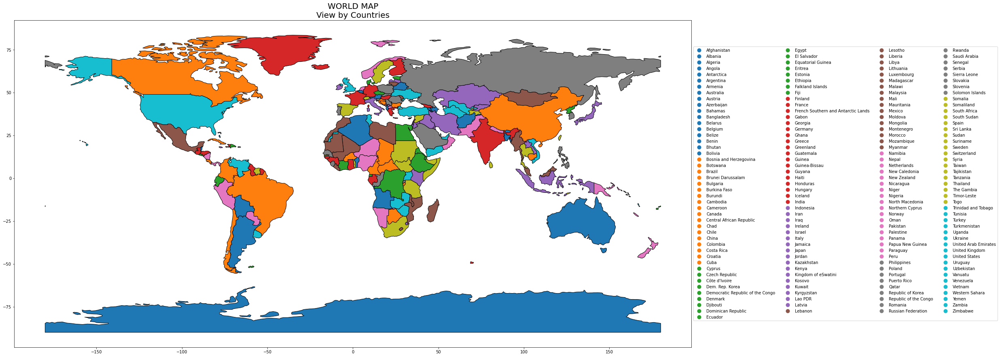

In [7]:
# Plotting the map
ax = world_df.plot(figsize=(30,15), column= 'name_long', cmap= 'tab10', 
                   edgecolor= 'black', legend= True, 
                   legend_kwds={'loc': 'center left', 'ncol': 4, 'bbox_to_anchor':(1,0.5)})
ax.set_title('WORLD MAP\nView by Countries', fontsize=20)
plt.show()

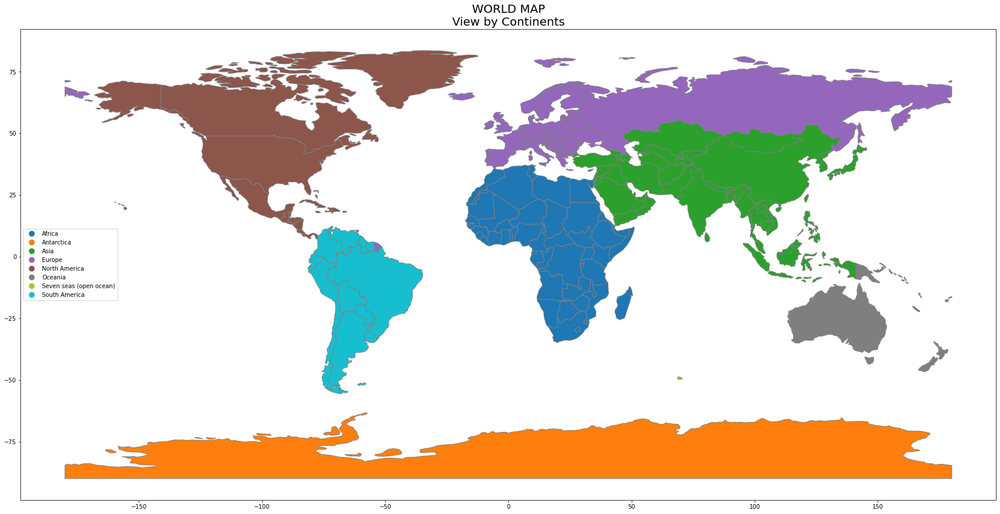

In [8]:
# Plotting the map
ax = world_df.plot(figsize=(30,15), column= 'continent', cmap= 'tab10', 
                   edgecolor= 'grey', legend= True, 
                   legend_kwds={'loc': 'center left'})#, 'ncol': 3, 'bbox_to_anchor':(1,0.5)})
ax.set_title('WORLD MAP\nView by Continents', fontsize=20)


plt.show()

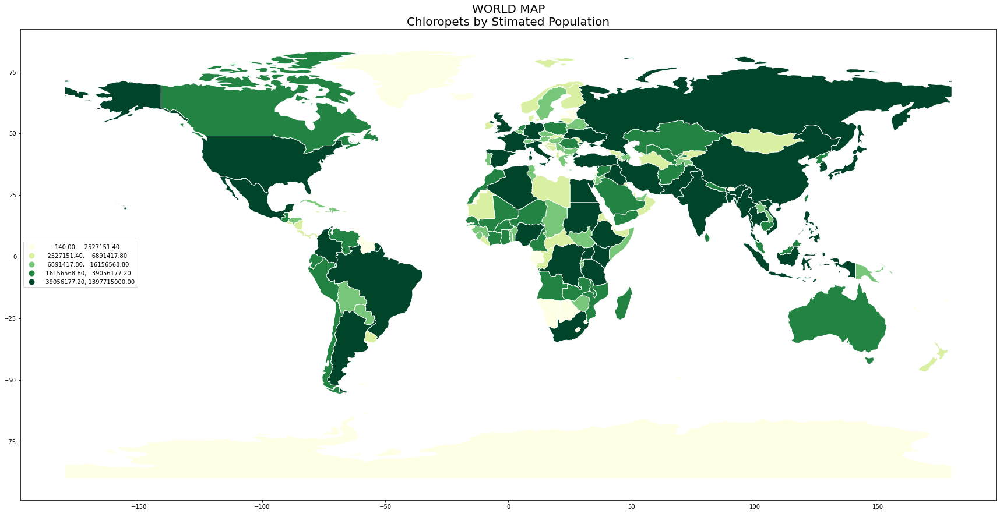

In [9]:
# Plotting the map
ax = world_df.plot(figsize=(30,20), column= 'pop_est', cmap= 'YlGn', scheme='quantiles',
                   edgecolor= 'white', legend= True, 
                   legend_kwds={'loc': 'center left'})
ax.set_title('WORLD MAP\nChloropets by Stimated Population', fontsize=20)
plt.show()

In [10]:
# for the purpose of use this boundaries as a clipper, the South America countries 
# (filtered on the CONTINENT feature) using pandas like dataframe management
south_america_df = world_df.loc[world_df.continent == 'South America',]

# fixing data
south_america_df = south_america_df.reset_index(drop=True)
#south_america_df.lastcensus = south_america_df.lastcensus.astype(str).replace({'-99':'1999'}).astype(int)

# features for plot
south_america_df['popu'] = south_america_df['pop_est'] / 1e6 # get the population in millions

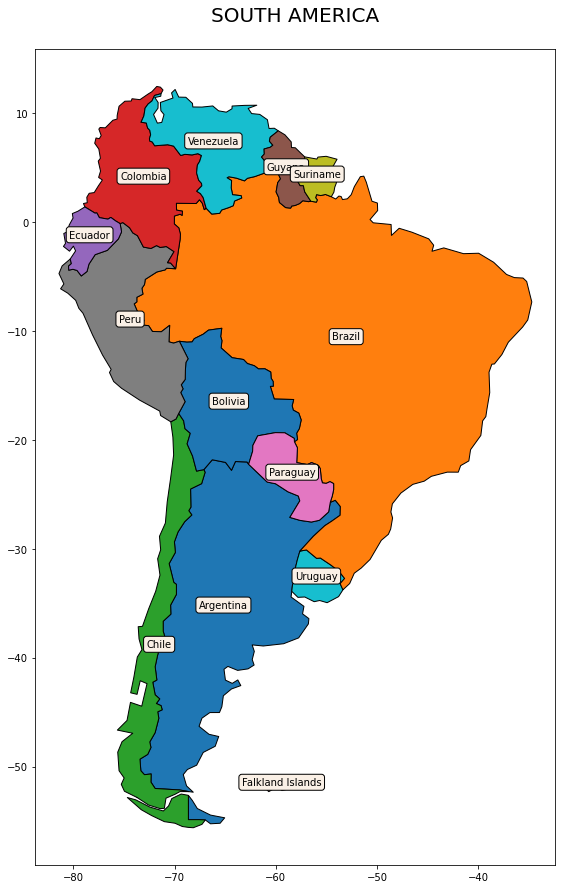

In [11]:
# Plotting the map
ax = south_america_df.plot(figsize=(10,15), column= 'name_long', cmap= 'tab10', 
                           edgecolor= 'black')
ax.set_title('SOUTH AMERICA\n', fontsize=20)

# names in the map
props = dict(boxstyle='round', facecolor='linen', alpha=1)
for point in south_america_df.iterrows():
  ax.text(point[1]['centroid'].x,
          point[1]['centroid'].y,
          point[1]['name_long'],
          horizontalalignment='center',
          fontsize=10,
          bbox=props)
# ax.axis('off') # for removing the grid
plt.show()

In [12]:
# for the purpose of use this boundaries as a clipper, the South America countries 
# (filtered on the CONTINENT feature) using pandas like dataframe management
asia_df = world_df.loc[world_df.continent == 'Asia',]

# fixing data
asia_df = asia_df.reset_index(drop=True)
#south_america_df.lastcensus = south_america_df.lastcensus.astype(str).replace({'-99':'1999'}).astype(int)

# features for plot
asia_df['popu'] = asia_df['pop_est'] /1e6  # get the population in millions

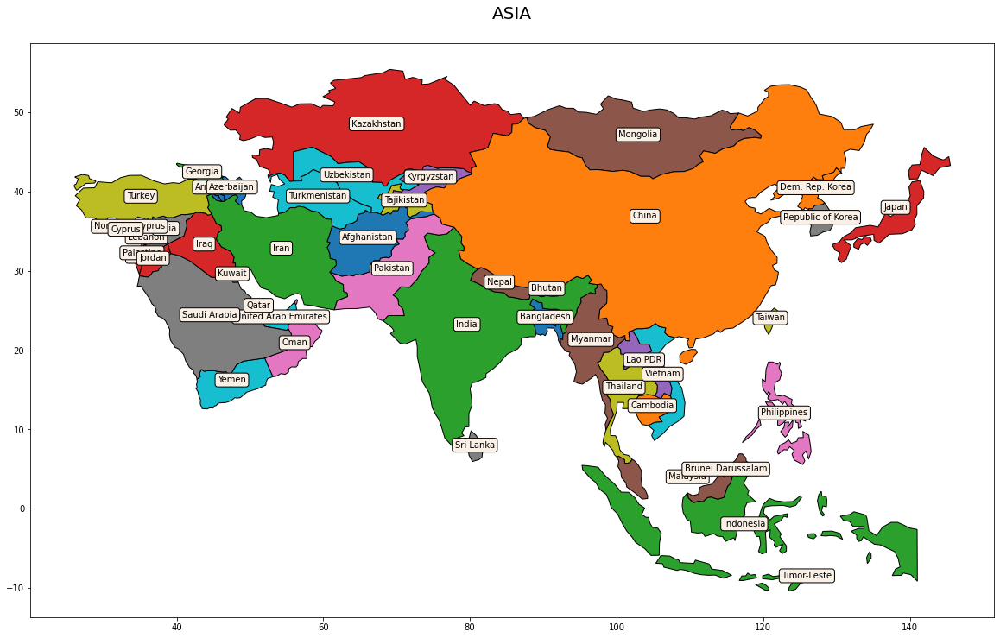

In [13]:
# Plotting the map
ax = asia_df.plot(figsize=(20,15), column= 'name_long', cmap= 'tab10', 
                           edgecolor= 'black')
ax.set_title('ASIA\n', fontsize=20)

# names in the map
props = dict(boxstyle='round', facecolor='linen', alpha=1)
for point in asia_df.iterrows():
  ax.text(point[1]['centroid'].x,
          point[1]['centroid'].y,
          point[1]['name_long'],
          horizontalalignment='center',
          fontsize=10,
          bbox=props)
# ax.axis('off') # for removing the grid
plt.show()

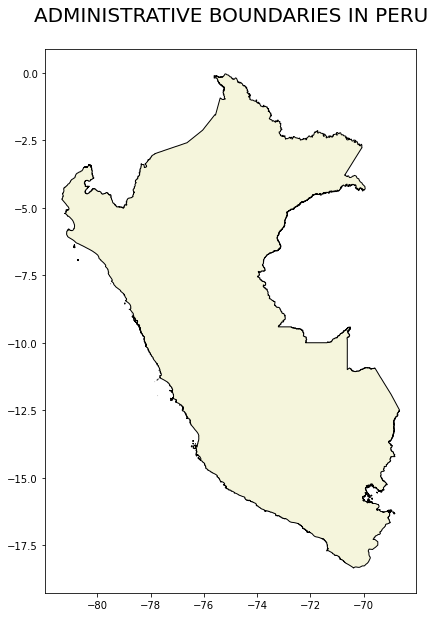

In [14]:
# Peru boundary dataset
boundary1 = 'https://datasets.mojaglobal.workers.dev/0:/Administrative/Boundaries/Level2%20by%20Country/PER/PER_AL2_Peru.json'

# download the data with request
boundary1_req = requests.get(boundary1).content

# load the json with geopandas and set crs
boundary_df = gpd.read_file(io.StringIO(boundary1_req.decode('utf-8')))
boundary_df = boundary_df[['name', 'geometry']]

# fix the georeference! the map seems to be cliped from a bad reference
boundary_df.to_crs(5389, inplace=True)
boundary_df.to_crs(4326, inplace=True) # now is WGS84 again!

# Plotting the map
ax = boundary_df.plot(figsize=(15,10), color= 'beige', edgecolor= 'black')
ax.set_title('ADMINISTRATIVE BOUNDARIES IN PERU\n', fontsize=20)
plt.show()

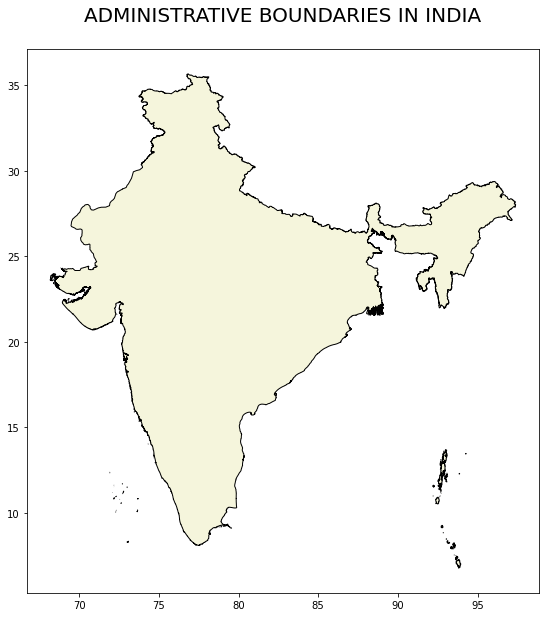

In [15]:
# India boundary dataset
boundary1 = 'https://datasets.mojaglobal.workers.dev/0:/Administrative/Boundaries/Level2%20by%20Country/IND/IND_AL2_India.json'

# download the data with request
boundary1_req = requests.get(boundary1).content

# load the json with geopandas and set crs
boundary_df = gpd.read_file(io.StringIO(boundary1_req.decode('utf-8')))
boundary_df = boundary_df[['name', 'geometry']]

# fix the georeference! the map seems to be cliped from a bad reference
boundary_df.to_crs(5389, inplace=True)
boundary_df.to_crs(4326, inplace=True) # now is WGS84 again!

# Plotting the map
ax = boundary_df.plot(figsize=(15,10), color= 'beige', edgecolor= 'black')
ax.set_title('ADMINISTRATIVE BOUNDARIES IN INDIA\n', fontsize=20)
plt.show()

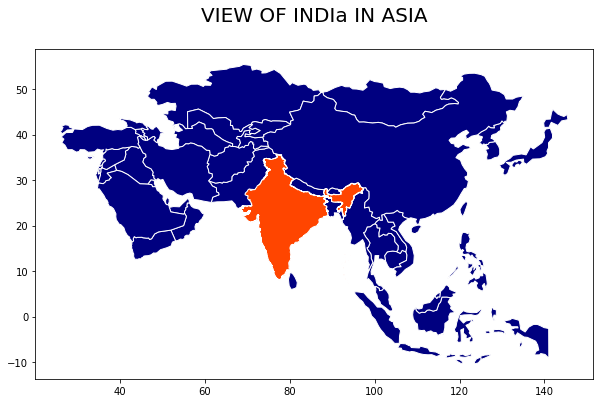

In [16]:
# Plotting India in Asia
ax = asia_df.plot(figsize=(10,15), color= 'navy', edgecolor= 'white')
boundary_df.plot(ax=ax, color='orangered', edgecolor='white')
ax.set_title('VIEW OF INDIa IN ASIA\n', fontsize=20)

plt.show()

In [17]:
# Indian States for review : Maharashtra and Karnataka

# state (Departamento) dataset
mh1 = 'https://datasets.mojaglobal.workers.dev/0:/Administrative/Boundaries/Level4%20by%20State/IND/IND_AL4_Maharashtra_WSR.json'
kn1 = 'https://datasets.mojaglobal.workers.dev/0:/Administrative/Boundaries/Level4%20by%20State/IND/IND_AL4_Karnataka_GEZ.json'

# download the data with request
mh1_req = requests.get(mh1).content
kn1_req = requests.get(kn1).content

# load the json with geopandas and set crs
mhBoundary_df = gpd.read_file(io.StringIO(mh1_req.decode('utf-8')))
mhBoundary_df = mhBoundary_df[['name', 'geometry']]
mhBoundary_df.set_crs(epsg=4326, inplace=True)
knBoundary_df = gpd.read_file(io.StringIO(kn1_req.decode('utf-8')))
knBoundary_df = knBoundary_df[['name', 'geometry']]
knBoundary_df.set_crs(epsg=4326, inplace=True)

# fix the georeference! the map seems to be cliped from a bad reference
mhBoundary_df.to_crs(5389, inplace=True)
mhBoundary_df.to_crs(4326, inplace=True) 
knBoundary_df.to_crs(5389, inplace=True)
knBoundary_df.to_crs(4326, inplace=True)


print('Maharashtra dataset has %2d rows and %2d columns' %(mhBoundary_df.shape[0], mhBoundary_df.shape[1]))
print('Karnataka dataset has %2d rows and %2d columns' %(knBoundary_df.shape[0], knBoundary_df.shape[1]))

Maharashtra dataset has  3 rows and  2 columns
Karnataka dataset has  4 rows and  2 columns


In [18]:
# Using pandas to concatenate the dataframes. This is so cool!
regionsBoundary_df = pd.concat([mhBoundary_df, knBoundary_df], ignore_index=True)

# features for plot
regionsBoundary_df['centroid'] = regionsBoundary_df.geometry.centroid # adding centroid for plotting names in the map

C:\Users\shubh\AppData\Local\Temp\ipykernel_24280\3547055613.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  regionsBoundary_df['centroid'] = regionsBoundary_df.geometry.centroid # adding centroid for plotting names in the map


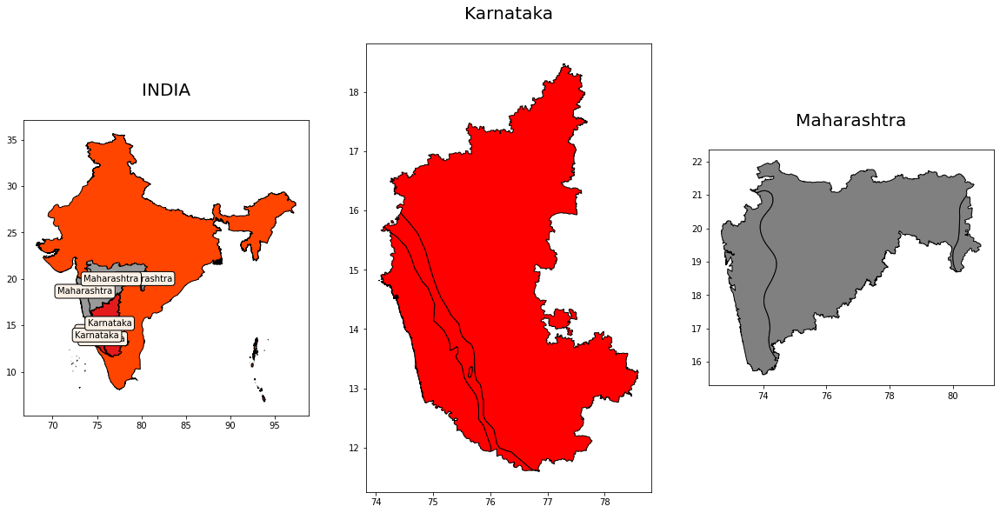

In [19]:
# Plotting in the maps
fig, axes = plt.subplots(1,3, figsize=(20,50))

# first map axes[0]
axes[0].set_title('INDIA\n', fontsize=20)
boundary_df.plot(ax=axes[0], color='orangered', edgecolor='black')
regionsBoundary_df.plot(ax=axes[0], column='name', cmap='Set1', edgecolor='black')
# names in the map
props = dict(boxstyle='round', facecolor='linen', alpha=1)
for point in regionsBoundary_df.iterrows():
  axes[0].text(point[1]['centroid'].x,
          point[1]['centroid'].y,
          point[1]['name'],
          horizontalalignment='center',
          fontsize=10,
          bbox=props)

# second map axes[1]
axes[1].set_title('Karnataka\n', fontsize=20)
knBoundary_df.plot(ax=axes[1], color='red', edgecolor='black')

# third map axes[2]
axes[2].set_title('Maharashtra\n', fontsize=20)
mhBoundary_df.plot(ax=axes[2], color='grey', edgecolor='black')

plt.show()

In [20]:
# World Soil resources
soil1 = 'https://datasets.mojaglobal.workers.dev/0:/Soil/World%20Soil%20Resources/World_Soil_Resources_wgs84.geojson'

# download the data with request
soil1_req = requests.get(soil1).content

# load the json with geopandas
soil_df = gpd.read_file(io.StringIO(soil1_req.decode('utf-8')))
soil_df.set_crs(epsg=4326, inplace=True)

# fixing the data: standardizing column names
soil_df.columns = soil_df.columns.str.lower()

print('World Soil resources dataset has %2d rows and %2d columns' %(soil_df.shape[0], soil_df.shape[1]))

World Soil resources dataset has 33 rows and  3 columns


In [21]:
# Climate Zones dataset
climate = 'https://datasets.mojaglobal.workers.dev/0:/Climate/IPCC_ClimateZoneMap_Vector.geojson'

# download the data with request
climate_req = requests.get(climate).content

# load the json with geopandas
climate_df = gpd.read_file(io.StringIO(climate_req.decode('utf-8')))
climate_df.set_crs(epsg=4326, inplace=True)

# standardizing column names
climate_df.columns = climate_df.columns.str.lower()

print('World Climate Zones dataset has %2d rows and %2d columns.' %(climate_df.shape[0], climate_df.shape[1]))

World Climate Zones dataset has 26165 rows and  2 columns.


In [22]:
# Replacing the data that was in codes
classification =  {'1': 'Tropical montane', '2' : 'Tropical wet', 
                   '3': 'Tropical moist', '4': 'Tropical dry', 
                   '5': 'Warm temperate moist', '6': 'Warm temperate dry',
                   '7': 'Cool temperate moist', '8': 'Cool temperate dry',
                   '9': 'Boreal moist', '10': 'Boreal dry', '11' : 'Polar moist',
                   '12': 'Polar dry'}


# renaming class_name
climate_df.class_name = climate_df.class_name.astype('str').replace(classification)

# removing oceans
climate_df =  climate_df.loc[climate_df.class_name != '0']

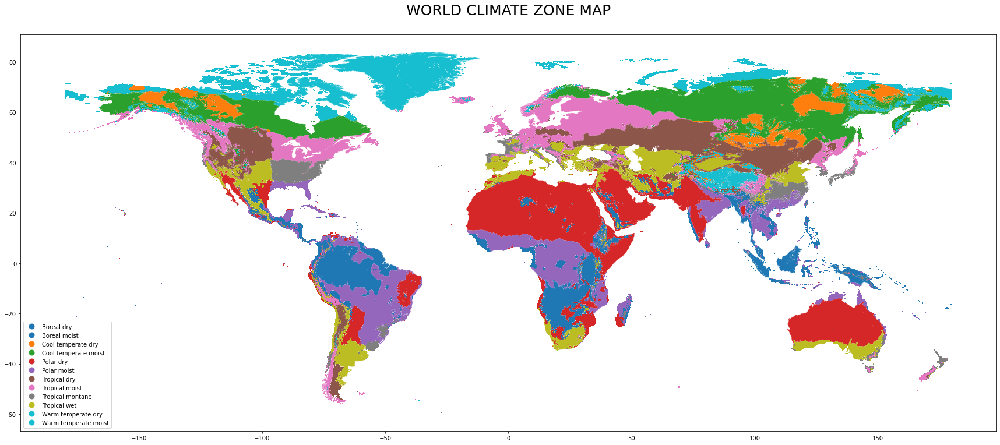

In [23]:
# plotting the map
ax = climate_df.plot(figsize = (30,15), column = 'class_name', legend= True, 
                     legend_kwds= {'loc': 'lower left'})
ax.set_title('WORLD CLIMATE ZONE MAP\n', fontsize=25)
plt.show()

In [24]:
# creating dataframe
asiaClimate_df = climate_df.clip(asia_df)
asiaClimate_df = asiaClimate_df.reset_index(drop=True)

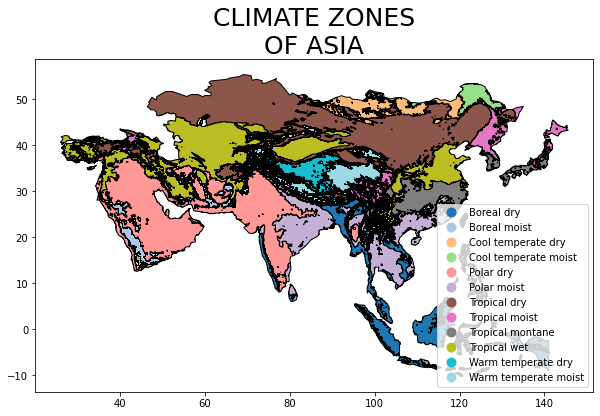

In [25]:
# Plotting in the maps
ax = asiaClimate_df.plot(figsize=(10,15), edgecolor='black', column = 'class_name', cmap='tab20',
                                    legend= True, legend_kwds={'loc': 'lower right'})
ax.set_title('CLIMATE ZONES\nOF ASIA', fontsize=25)
plt.show()

In [26]:
# creating dataframe
indiaClimate_df = climate_df.clip(boundary_df)
indiaClimate_df = indiaClimate_df.reset_index(drop=True)

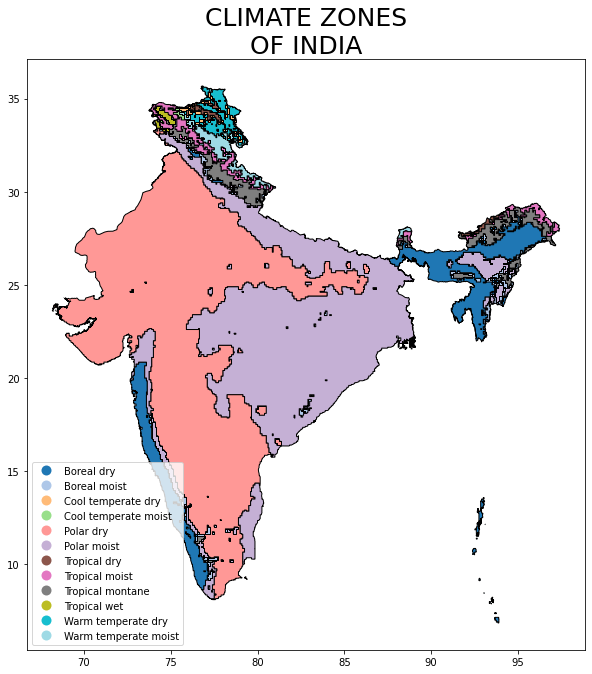

In [27]:
# Plotting in the maps
ax = indiaClimate_df.plot(figsize=(10,15), edgecolor='black', column = 'class_name', cmap='tab20',
                                    legend= True, legend_kwds={'loc': 'lower left'})
ax.set_title('CLIMATE ZONES\nOF INDIA', fontsize=25)
plt.show()

In [28]:
# creating dataframe
knClimate_df = climate_df.clip(knBoundary_df)
knClimate_df = knClimate_df.reset_index(drop=True)
mhClimate_df = climate_df.clip(mhBoundary_df)
mhClimate_df = mhClimate_df.reset_index(drop=True)

In [29]:
# Using pandas to concatenate the dataframes.
regionsClimate_df = pd.concat([mhClimate_df, knClimate_df], ignore_index=True)

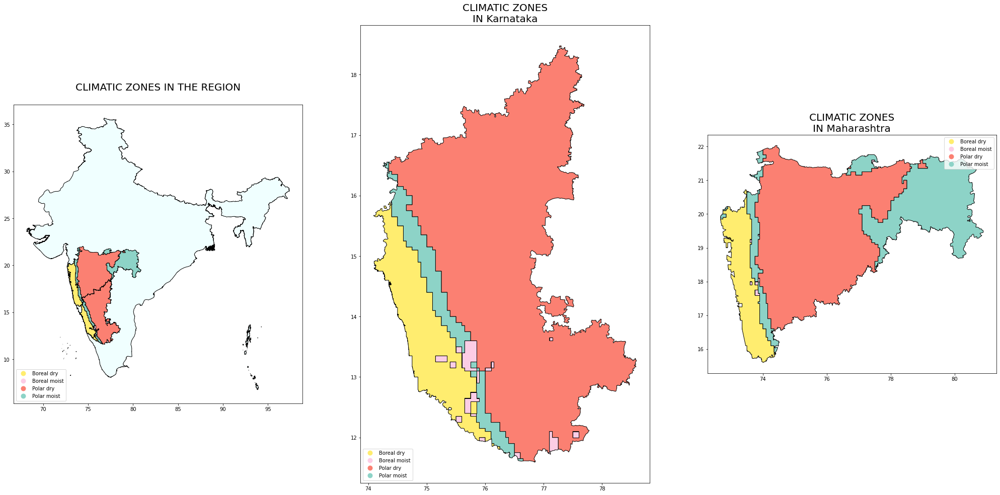

In [30]:
# Plotting in the maps
fig, axes = plt.subplots(1,3, figsize=(35,20))

# first map axes[0]
axes[0].set_title('CLIMATIC ZONES IN THE REGION\n', fontsize=20)
boundary_df.plot(ax=axes[0], color='azure', edgecolor='black')
regionsClimate_df.plot(ax=axes[0], column='class_name', cmap='Set3_r', edgecolor='black',
                    legend=True, legend_kwds={'loc': 'lower left'})

# second map axes[1]
axes[1].set_title('CLIMATIC ZONES\nIN Karnataka', fontsize=20)
knClimate_df.plot(ax=axes[1], column='class_name', cmap='Set3_r', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'lower left'})

# third map axes[2]
axes[2].set_title('CLIMATIC ZONES\nIN Maharashtra', fontsize=20)
mhClimate_df.plot(ax=axes[2], column='class_name', cmap='Set3_r', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'upper right'})
plt.show()

In [31]:
# Load the data and prepare the datasets
with zipfile.ZipFile('KoppenGeigerClimateShifts.zip', 'r') as shifts:
  shifts.extractall("shifts")

# remove zip
#%rm KoppenGeigerClimateShifts.zip

# path to the folder
files = glob.glob(os.path.join('C:/Users/shubh/shifts', '*geojson'))

In [32]:
# Rename and arrange the information
# prepare names
names = [i[22:31]+ '_' + i[32:34] for i in files]  

# prepare the files
files_loaded = [gpd.read_file(f) for f in files]

# merging all the metadata
koppen = list(zip(names, files_loaded))

# print the results
print('%2d dataset were imported for shift in climate Zones.' %(len(koppen)))

20 dataset were imported for shift in climate Zones.


In [33]:
for i in koppen:
    display(i[0])

'1901-1925_ge'

'1926-1950_ge'

'1951-1975_ge'

'1976-2000_ge'

'2001-2025_A1'

'2001-2025_A2'

'2001-2025_B1'

'2001-2025_B2'

'2026-2050_A1'

'2026-2050_A2'

'2026-2050_B1'

'2026-2050_B2'

'2051-2075_A1'

'2051-2075_A2'

'2051-2075_B1'

'2051-2075_B2'

'2076-2100_A1'

'2076-2100_A2'

'2076-2100_B1'

'2076-2100_B2'

In [34]:
# fixing the data, adding abbreviations and koppen-geiger terms

# the Koppen-Geiger system
koppen_abb = {'11': 'Af', '12': 'Am', '13': 'As', '14': 'Aw', '21': 'BWk', 
              '22': 'BWh', '26': 'BSk', '27': 'BSh', '31': 'Cfa', 
              '32': 'Cfb', '33': 'Cfc', '34': 'Csa', '35': 'Csb', 
              '36': 'Csc', '37': 'Cwa', '38': 'Cwb', '39': 'Cwc', 
              '41': 'Dfa', '42': 'Dfb', '43': 'Dfc', '44': 'Dfd', 
              '45': 'Dsa', '46': 'Dsb', '47': 'Dsc', '48': 'Dsd', 
              '49': 'Dwa', '50': 'Dwb', '51': 'Dwc', '52': 'Dwd', 
              '61': 'EF', '62': 'ET', '0': 'NaN'}

koppen_term ={'Af' : 'Tropical rainforest climate', 'Am' : 'Tropical monsoon climate', 
              'As' : 'Tropical savanna climate with dry-summer characteristics', 
              'Aw' : 'Tropical savanna climate with dry-winter characteristics', 
              'BWk' : 'Cold desert climate', 'BWh' : 'Hot desert climate', 
              'BSk' : 'Cold semi-arid climate', 'BSh' : 'Hot semi-arid climate', 
              'Cfa' : 'Humid subtropical climate;', 'Cfb' : 'Temperate oceanic climate', 
              'Cfc' : 'Subpolar oceanic climate', 'Csa' : 'Hot-summer Mediterranean climate', 
              'Csb' : 'Warm-summer Mediterranean climate', 'Csc' : 'Cold-summer Mediterranean climate', 
              'Cwa' : 'Monsoon-influenced humid subtropical climate', 'Cwb' : 'Subtropical highland climate', 
              'Cwc' : 'Cold subtropical highland climate', 'Dfa' : 'Hot-summer humid continental climate', 
              'Dfb' : 'Warm-summer humid continental climate', 'Dfc' : 'Subarctic climate', 
              'Dfd' : 'Extremely cold subarctic climate', 'Dsa' : 'Mediterranean-influenced hot-summer humid continental climate', 
              'Dsb' : 'Mediterranean-influenced warm-summer humid continental climate', 
              'Dsc' : 'Mediterranean-influenced subarctic climate', 'Dsd' : 'Mediterranean-influenced extremely cold subarctic climate', 
              'Dwa' : 'Monsoon-influenced hot-summer humid continental climate', 'Dwb' : 'Monsoon-influenced warm-summer humid continental climate', 
              'Dwc' : 'Monsoon-influenced subarctic climate', 'Dwd' : 'Monsoon-influenced extremely cold subarctic climate', 
              'EF' : 'Ice cap climate', 'ET' : 'Tundra climate'}

# replacing in all the dataframes
for i in koppen:
    name, df = i
    # fixing df, lower columns
    df.columns = df.columns.str.lower()
    # mapping abbreviations
    df['gridcode'] = df['gridcode'].fillna(0) # handle empty
    df['gridcode'] = df['gridcode'].astype(int) # coercing for replace
    df['abb'] = df.gridcode.astype(str).replace(koppen_abb)
    # mappin name
    df['koppen'] = df.abb.replace(koppen_term)
    # selecting columns
    df = df[['abb', 'koppen', 'geometry', 'shape_length', 'shape_area']]

In [35]:
# Plotting function - for horizontal
def plot_shift(df_list):
    font = {'family': 'serif',
          'color':  'darkred',
          'weight': 'normal',
          'size': 30,
          }

    fig, axs = plt.subplots(2,2, figsize=(30, 15), facecolor='w', edgecolor='k')

    for ax, i in zip(axs.ravel(),df_list) :
        name, df = i
        #name correction
        if '_' in name:
            name = name.replace('_', ' in ')

        df.set_crs(epsg=4326, inplace=True)
        df.plot(ax = ax, column='abb', cmap='tab20c',
            legend=True, legend_kwds= {'ncol': 3, 'loc': 'lower left'})
        ax.set_title(str(name), fontdict=font)
    plt.tight_layout()
    plt.show()

In [36]:
# Plotting function - for south america - peru
def plot_shiftv(df_list, legend_loc):
    font = {'family': 'serif',
          'color':  'darkred',
          'weight': 'normal',
          'size': 30,
          }

    fig, axs = plt.subplots(2,2, figsize=(30, 30), facecolor='w', edgecolor='k')

    for ax, i in zip(axs.ravel(),df_list) :
        name, df = i
        #name correction
        if '_' in name:
            name = name.replace('_', ' in ')

        df.set_crs(epsg=4326, inplace=True)
        df.plot(ax = ax, column='koppen', cmap='tab20c',
            legend=True, legend_kwds= {'ncol': 2, 'loc': legend_loc}) #, 'bbox_to_anchor':(1,0.5)})
        ax.set_title(str(name), fontdict=font)
    plt.tight_layout()
    plt.show()

In [37]:
# Plotting function - for regions
def plot_shift_region(df_list,legend_loc):
    font = {'family': 'serif',
          'color':  'darkred',
          'weight': 'normal',
          'size': 30,
          }

    fig, axs = plt.subplots(2,2, figsize=(15, 15), facecolor='w', edgecolor='k')

    for ax, i in zip(axs.ravel(),df_list) :
        name, df = i
        #name correction
        if '_' in name:
            name = name.replace('_', ' in ')

        df.set_crs(epsg=4326, inplace=True)
        df.plot(ax = ax, column='koppen', cmap='tab20c',
            legend=True, legend_kwds= {'loc': legend_loc})
        ax.set_title(str(name), fontdict=font)
    plt.tight_layout()
    plt.show()

In [38]:
#Shifts bases on observations

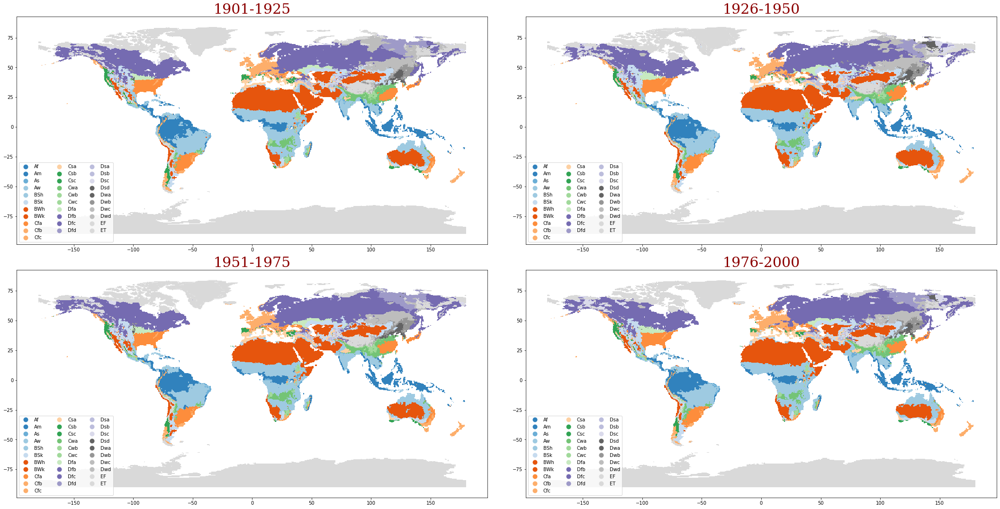

In [39]:
# creating a new list for observations geojson (no other code than years)
observations_world = []
for i in koppen:
    name, df = i
    #display(name)
    if name[-2:] == 'ge':
        observations_world.append((name[:-3], df))

    # sorting the list by year
observations_world = sorted(observations_world, key = lambda x: int(x[0][0:3]))

# plotting variations in observations
plot_shift(observations_world)

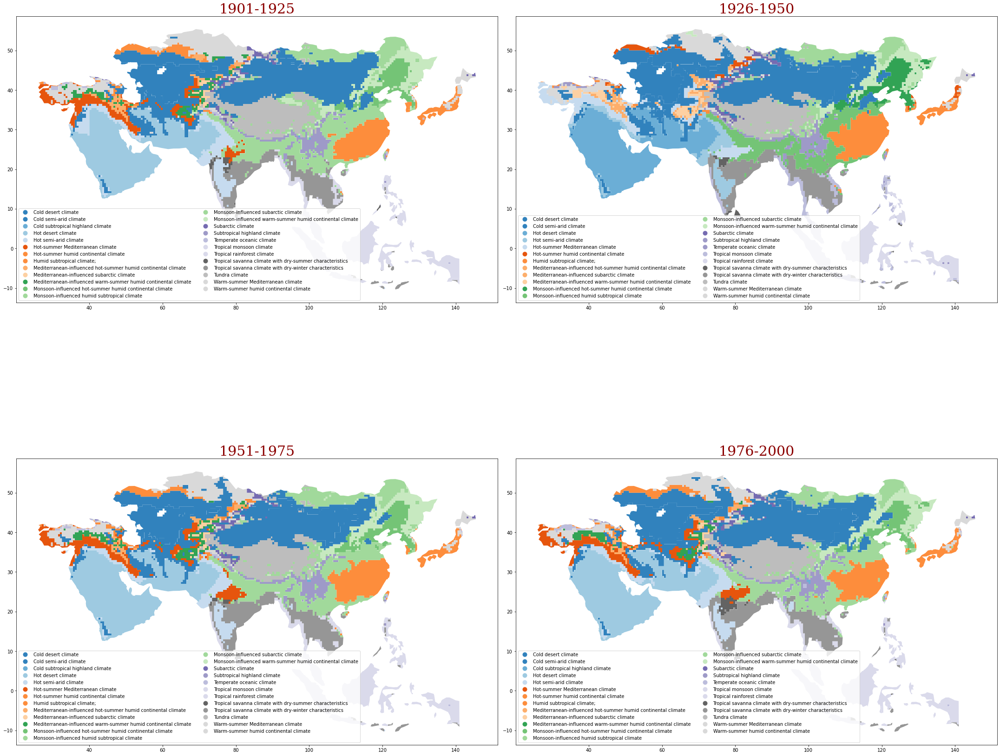

In [40]:
# creating a new list for observations geojson for SA
observations_asia = []
for i in observations_world:
    name, df = i
    temp = df.clip(asia_df)
    temp = temp.reset_index(drop=True)
    observations_asia.append((name, temp))

# plotting variations in observations
plot_shiftv(observations_asia, 'lower left')

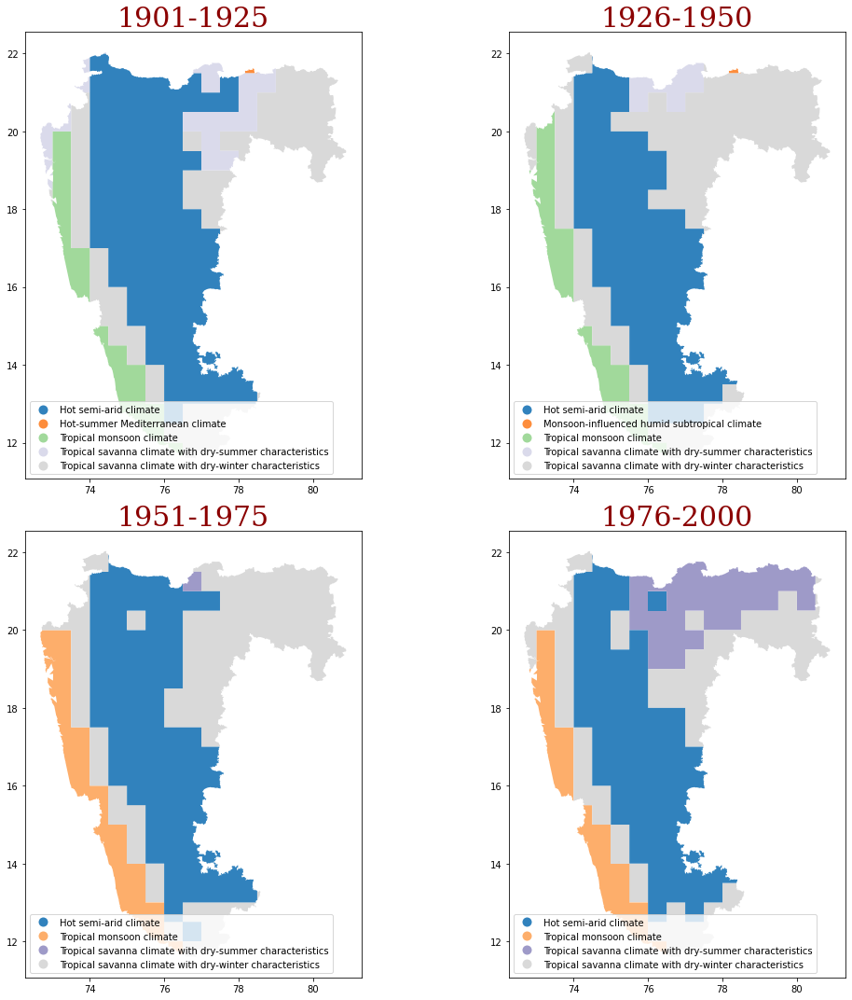

In [41]:
# creating a new list for observations geojson for SA
observations_region = []
for i in observations_world:
  name, df = i
  temp = df.clip(regionsBoundary_df)
  temp = temp.reset_index(drop=True)
  observations_region.append((name, temp))

# plotting variations in observations
plot_shift_region(observations_region, 'lower left')

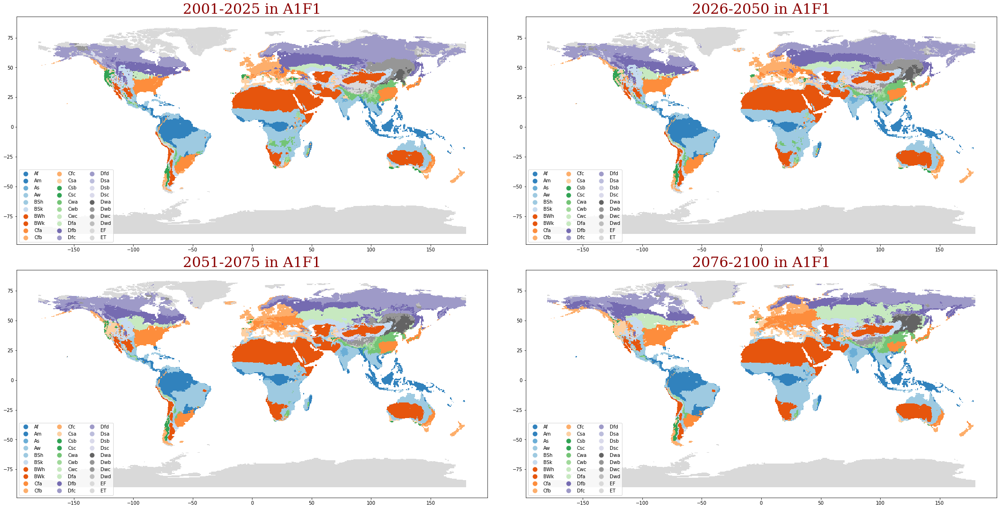

In [42]:
# creating a new list for a1f1
a1f1_world = []
for i in koppen:
  name, df = i
  if name[-2:] == 'A1':
    a1f1_world.append((name +'F1', df))

# sorting the list by year
a1f1_world = sorted(a1f1_world, key = lambda x: int(x[0][0:3]))

# plotting variations in a1f1
plot_shift(a1f1_world)

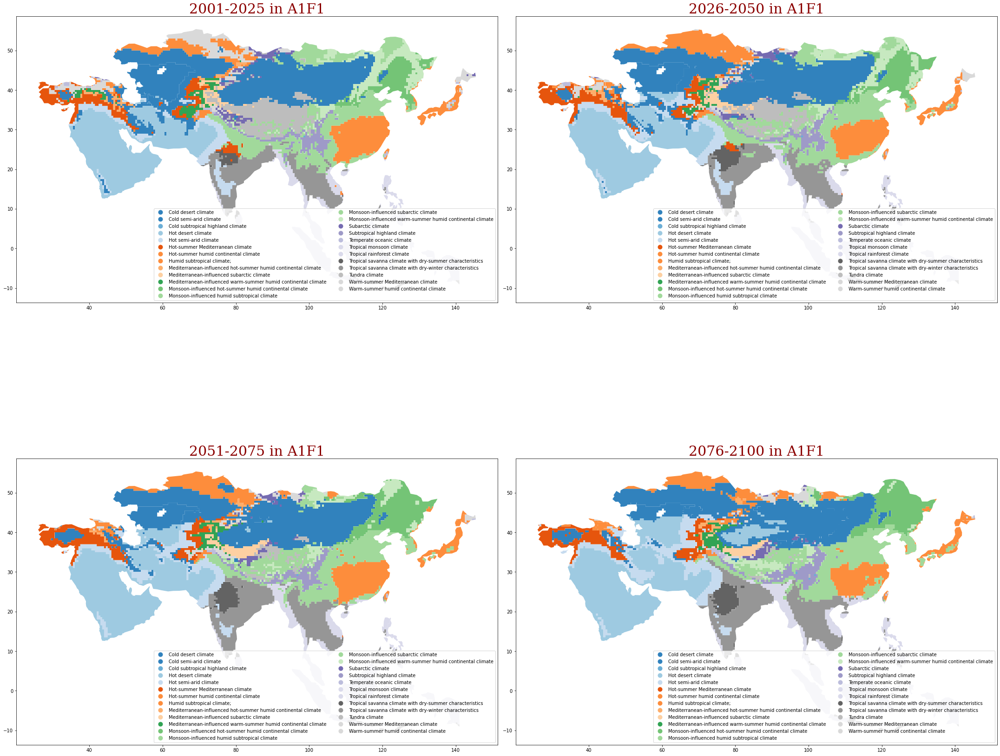

In [43]:
# creating a new list for observations geojson for SA
a1f1_asia = []
for i in a1f1_world:
  name, df = i
  temp = df.clip(asia_df)
  temp = temp.reset_index(drop=True)
  a1f1_asia.append((name, temp))

# plotting variations in observations
plot_shiftv(a1f1_asia, 'lower right')

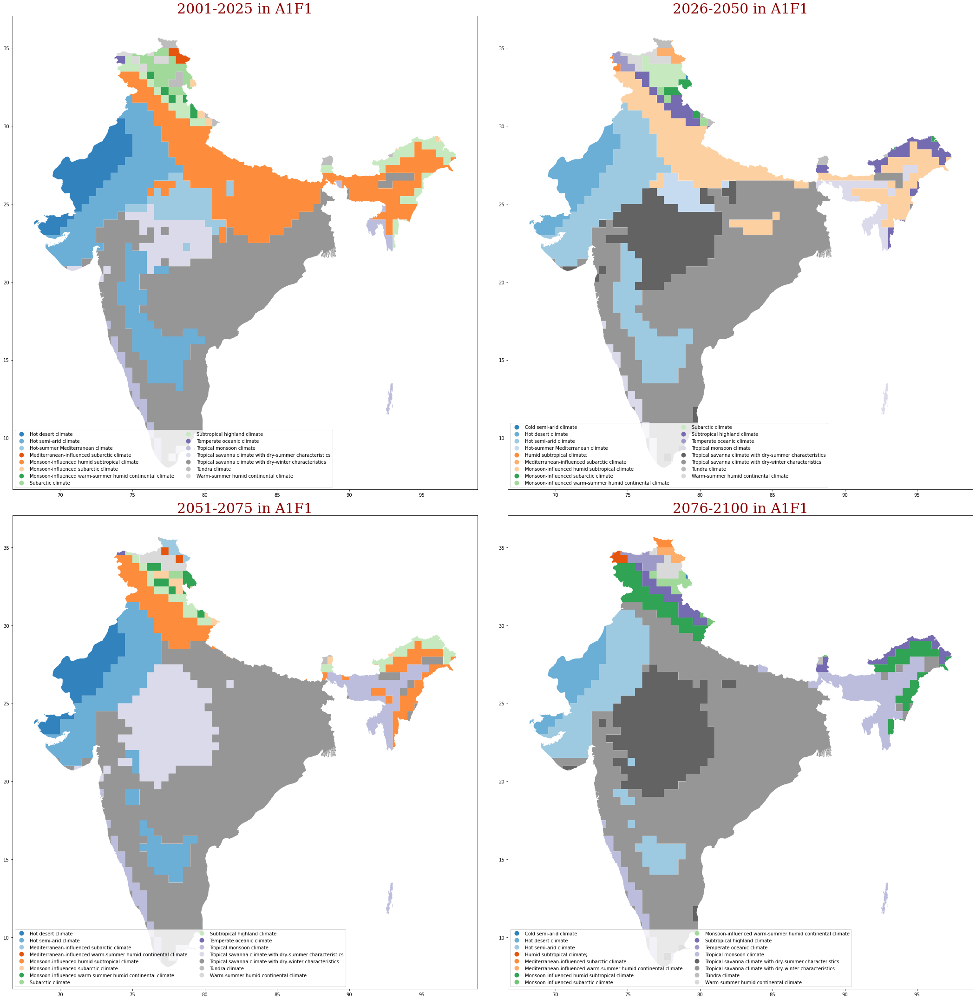

In [44]:
# creating a new list for observations geojson
a1f1_india = []
for i in a1f1_world:
  name, df = i
  temp = df.clip(boundary_df)
  temp = temp.reset_index(drop=True)
  a1f1_india.append((name, temp))

# plotting variations in observations
plot_shiftv(a1f1_india, 'lower left')

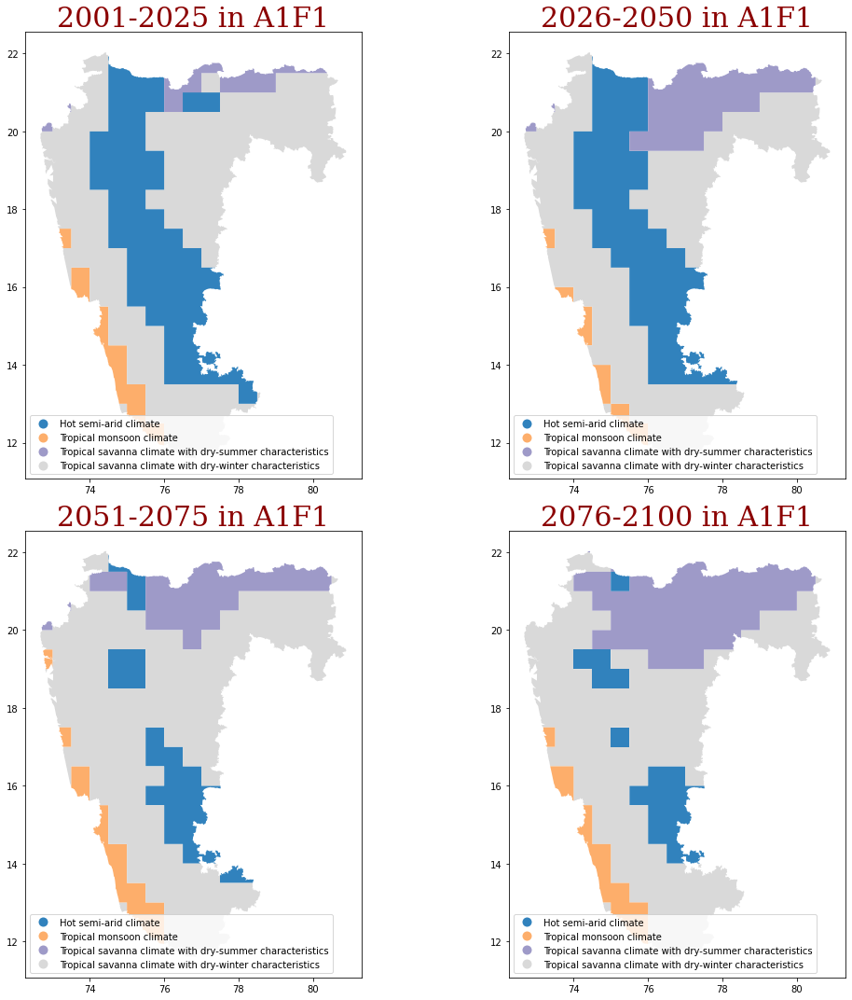

In [45]:
# creating a new list for observations geojson
a1f1_region = []
for i in a1f1_world:
  name, df = i
  temp = df.clip(regionsBoundary_df)
  temp = temp.reset_index(drop=True)
  a1f1_region.append((name, temp))

# plotting variations in observations
plot_shift_region(a1f1_region, 'lower left')

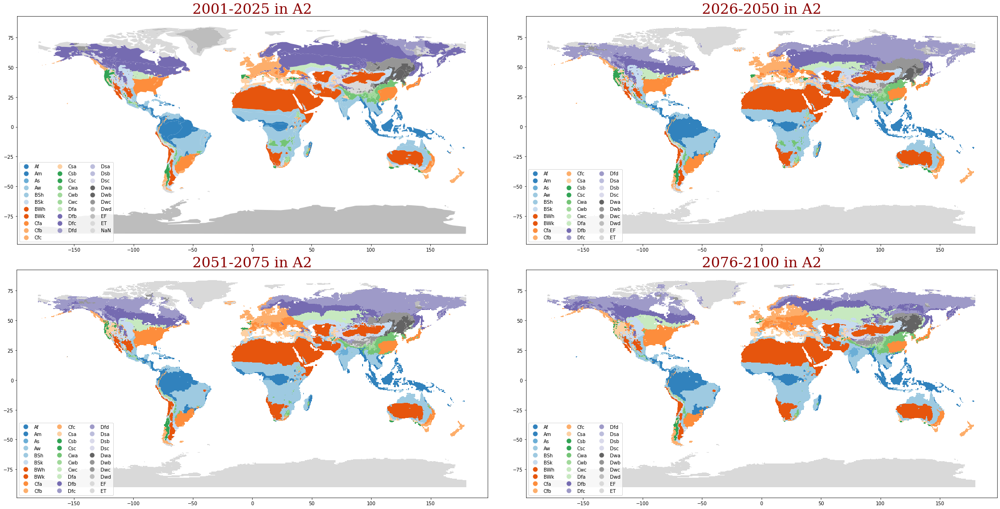

In [46]:
# creating a new list for a2
a2_world = []
for i in koppen:
  name, df = i
  if name[-2:] == 'A2':
    a2_world.append((name, df))

# sorting the list by year
a2_world = sorted(a2_world, key = lambda x: int(x[0][0:3]))

# plotting variations in a1f1
plot_shift(a2_world)

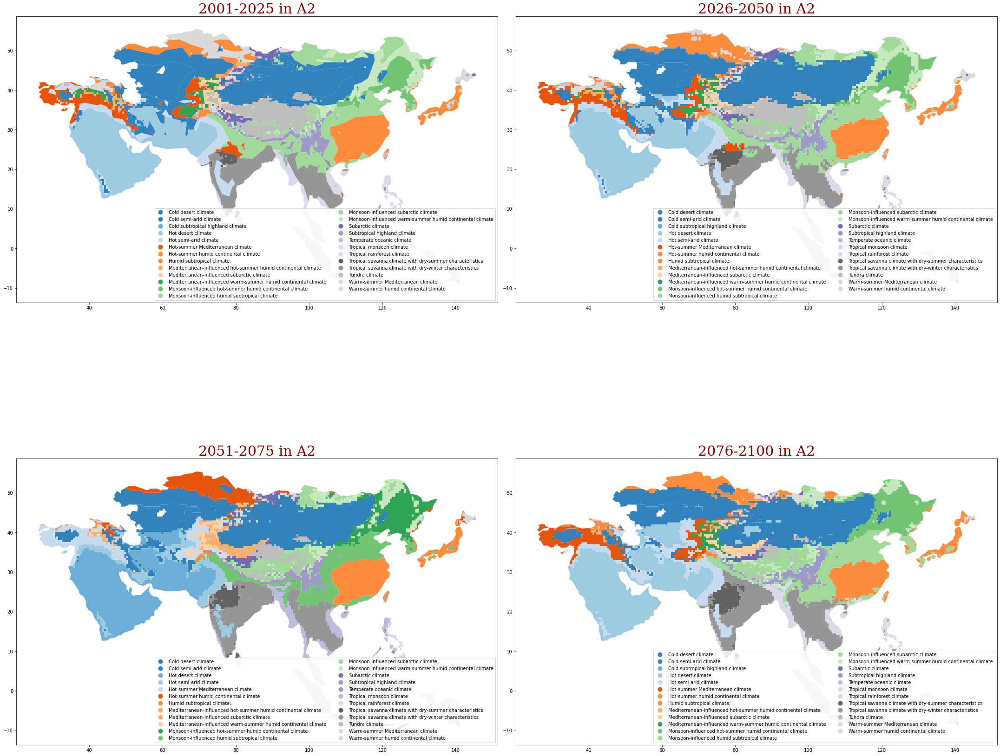

In [47]:
# creating a new list for observations geojson for SA
a2_asia = []
for i in a2_world:
  name, df = i
  temp = df.clip(asia_df)
  temp = temp.reset_index(drop=True)
  a2_asia.append((name, temp))

# plotting variations in observations
plot_shiftv(a2_asia, 'lower right')

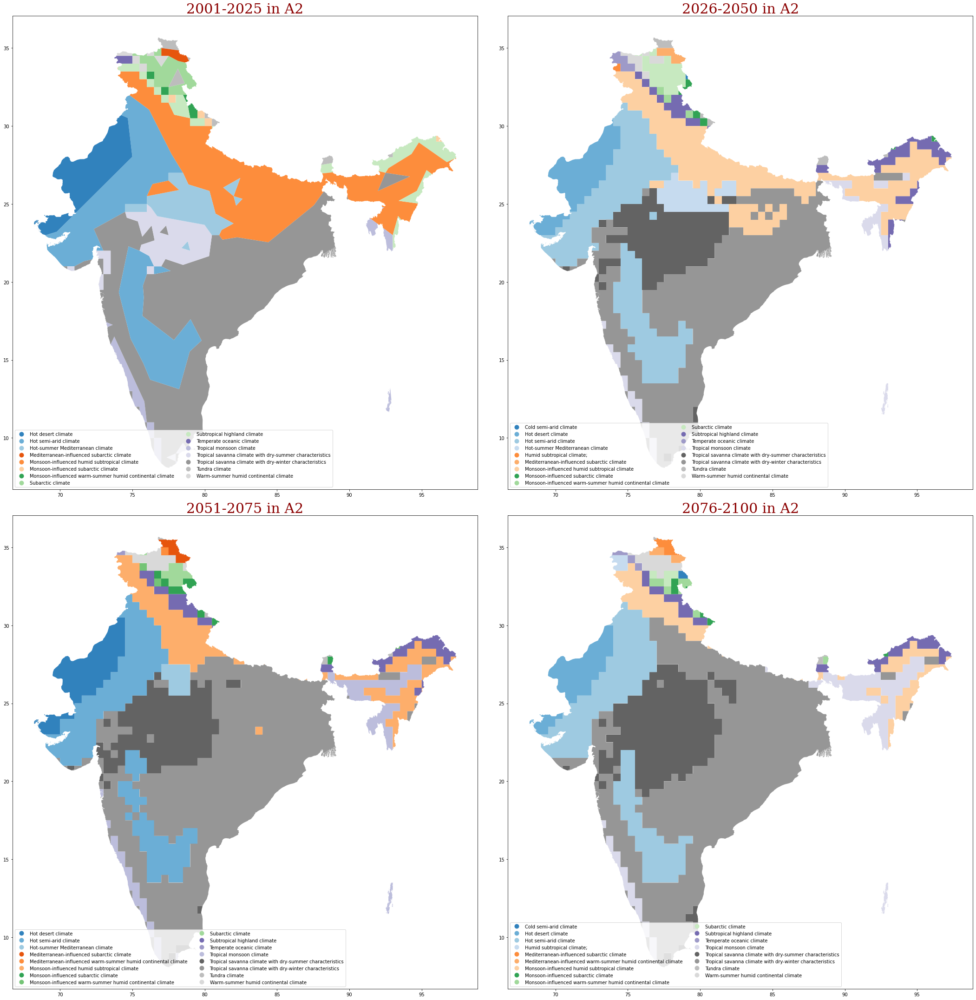

In [48]:
# creating a new list for observations geojson
a2_india = []
for i in a2_world:
  name, df = i
  temp = df.clip(boundary_df)
  temp = temp.reset_index(drop=True)
  a2_india.append((name, temp))

# plotting variations in observations
plot_shiftv(a2_india, 'lower left')

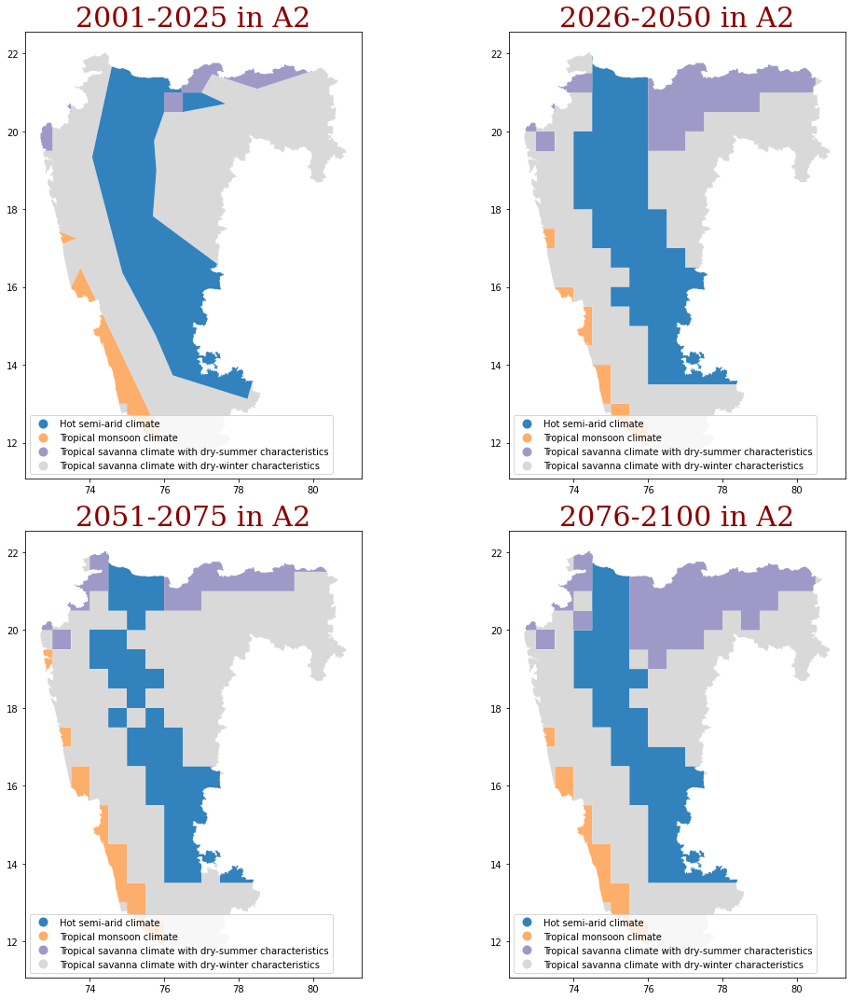

In [49]:
# creating a new list for observations geojson
a2_region = []
for i in a2_world:
  name, df = i
  temp = df.clip(regionsBoundary_df)
  temp = temp.reset_index(drop=True)
  a2_region.append((name, temp))

# plotting variations in observations
plot_shift_region(a2_region, 'lower left')

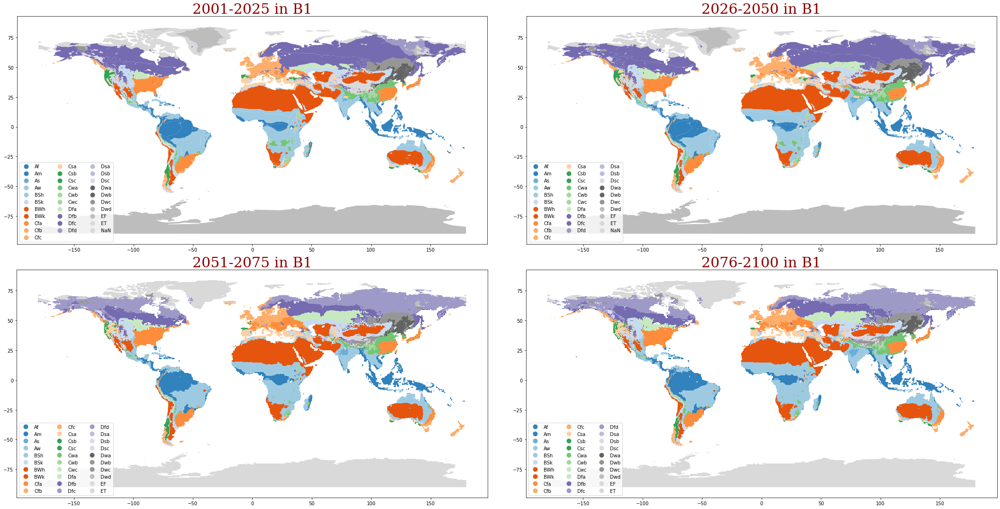

In [50]:
# creating a new list for b1
b1_world = []
for i in koppen:
  name, df = i
  if name[-2:] == 'B1':
    b1_world.append((name, df))

# sorting the list by year
b1_world = sorted(b1_world, key = lambda x: int(x[0][0:3]))

# plotting variations in a1f1
plot_shift(b1_world)

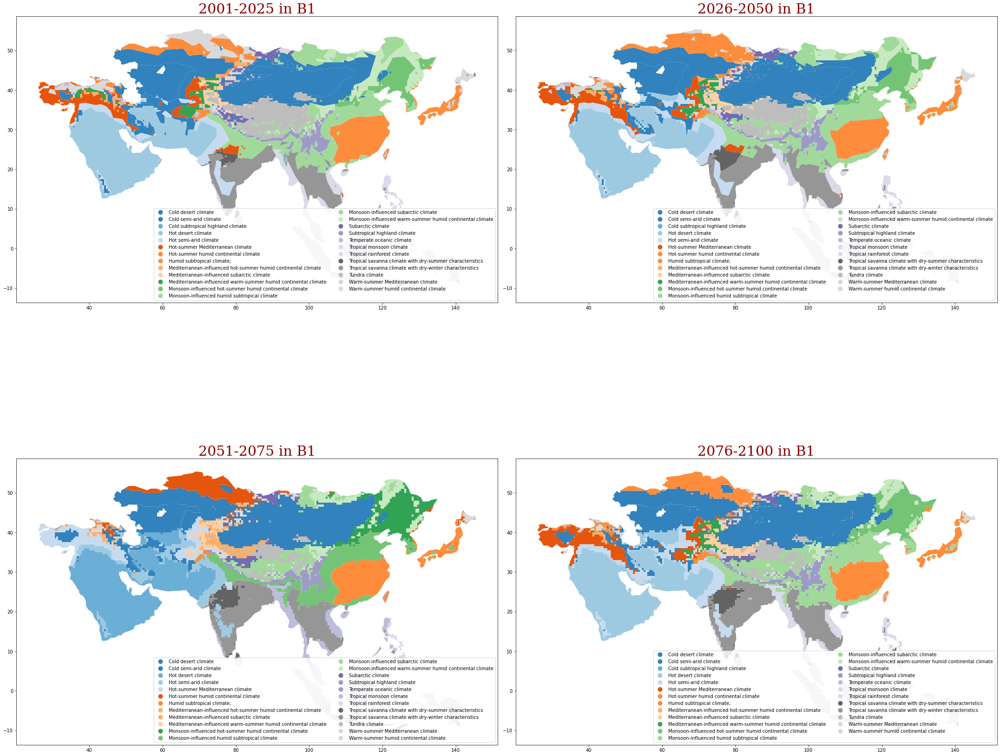

In [51]:
# creating a new list for observations geojson for SA
b1_asia = []
for i in b1_world:
  name, df = i
  temp = df.clip(asia_df)
  temp = temp.reset_index(drop=True)
  b1_asia.append((name, temp))

# plotting variations in observations
plot_shiftv(b1_asia, 'lower right')

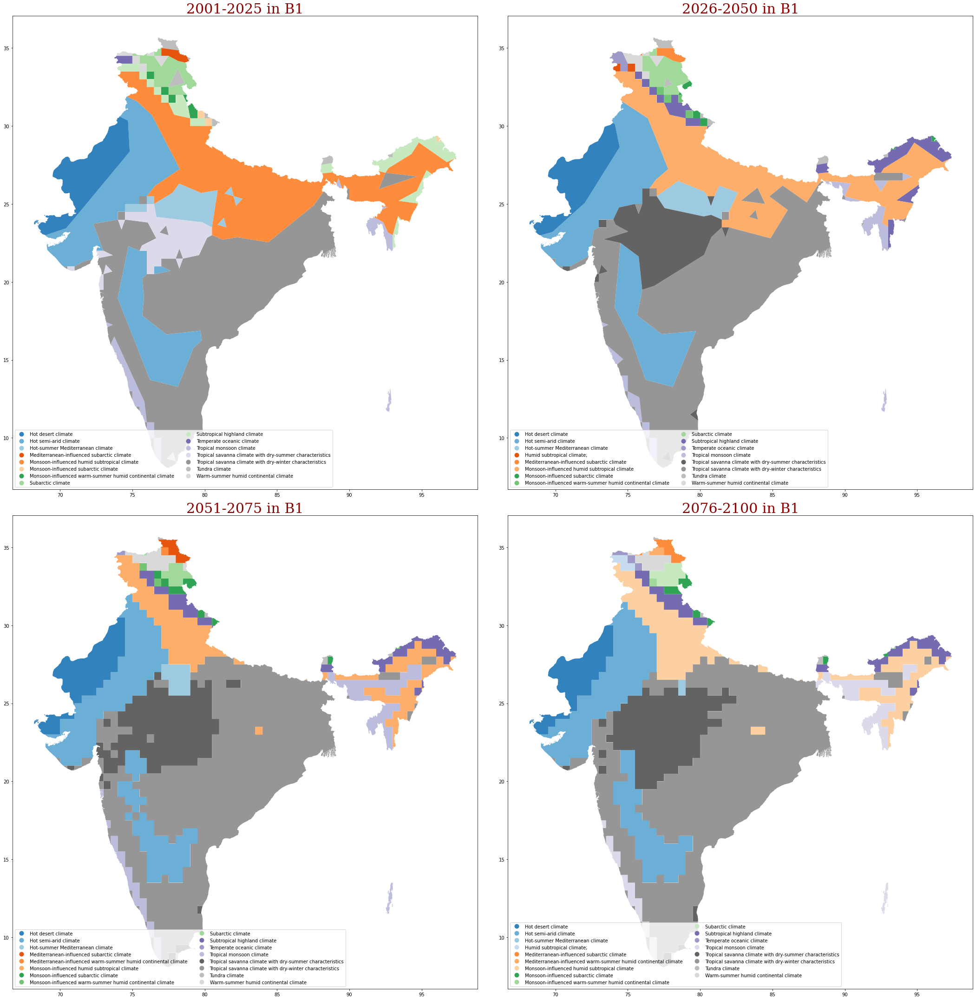

In [52]:
# creating a new list for observations geojson
b1_india = []
for i in b1_world:
  name, df = i
  temp = df.clip(boundary_df)
  temp = temp.reset_index(drop=True)
  b1_india.append((name, temp))

# plotting variations in observations
plot_shiftv(b1_india, 'lower left')

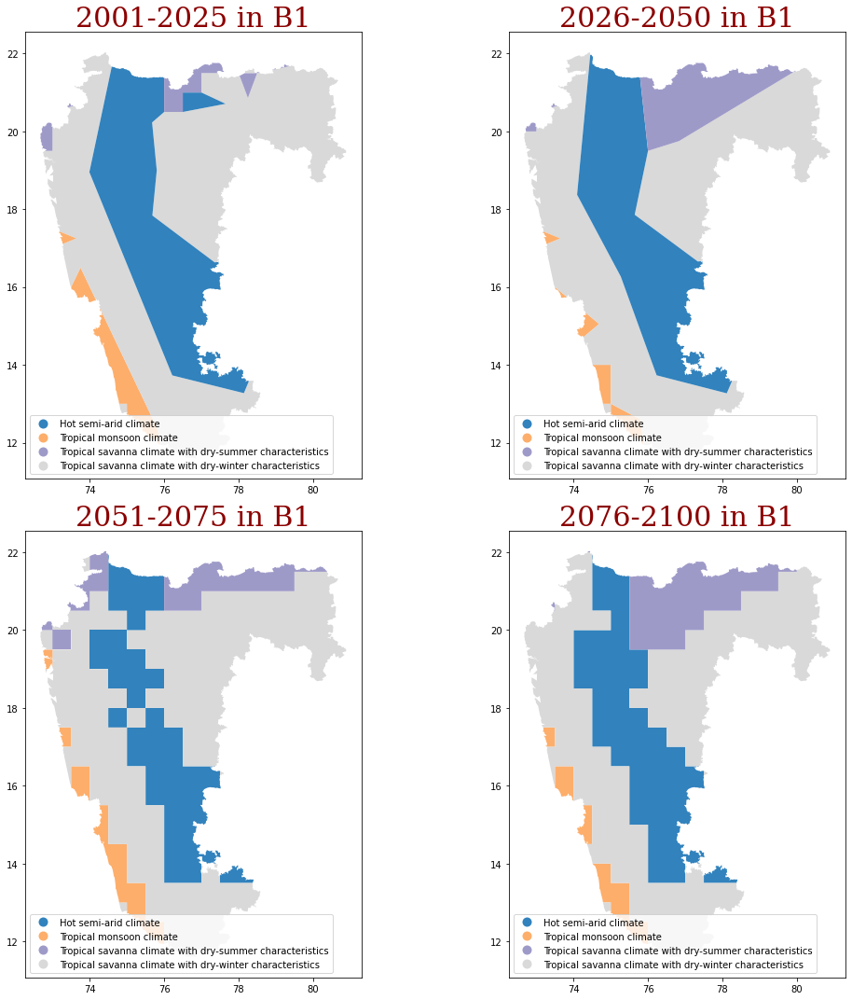

In [53]:
# creating a new list for observations geojson
b1_region = []
for i in b1_world:
  name, df = i
  temp = df.clip(regionsBoundary_df)
  temp = temp.reset_index(drop=True)
  b1_region.append((name, temp))

# plotting variations in observations
plot_shift_region(b1_region, 'lower left')

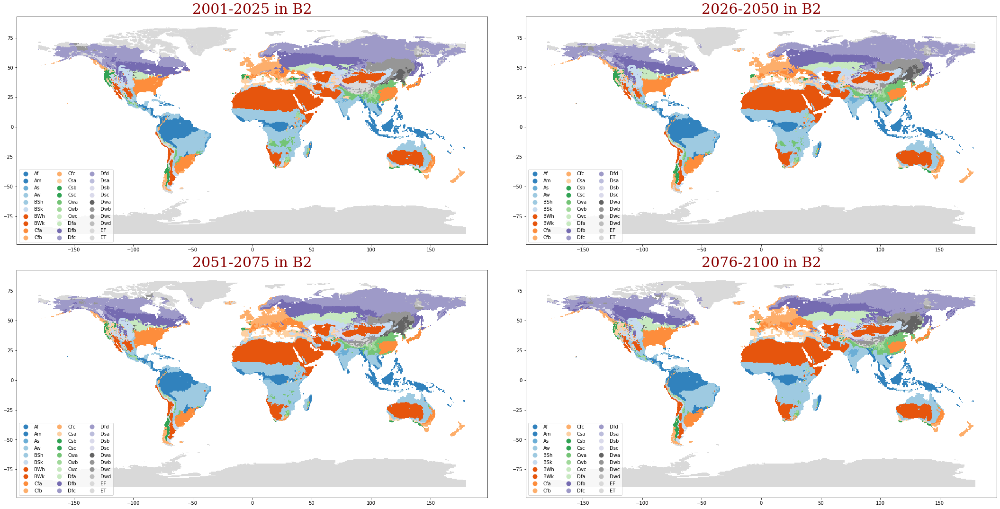

In [54]:
# creating a new list for b1
b2_world = []
for i in koppen:
  name, df = i
  if name[-2:] == 'B2':
    b2_world.append((name, df))

# sorting the list by year
b2_world = sorted(b2_world, key = lambda x: int(x[0][0:3]))

# plotting variations in a1f1
plot_shift(b2_world)

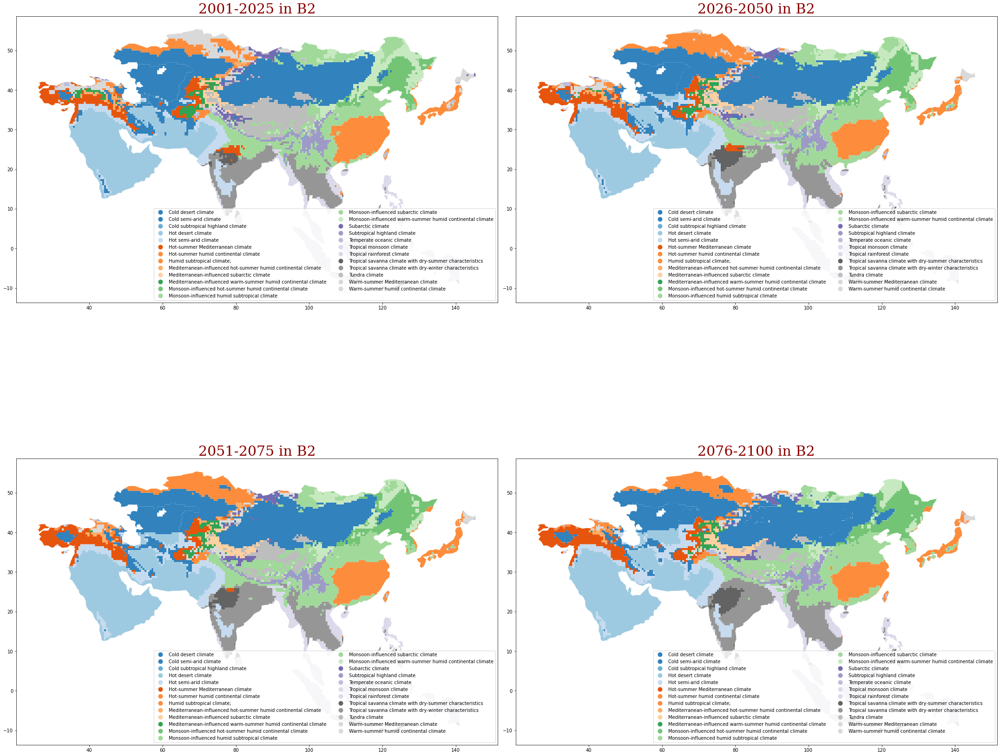

In [55]:
# creating a new list for observations geojson for SA
b2_asia = []
for i in b2_world:
  name, df = i
  temp = df.clip(asia_df)
  temp = temp.reset_index(drop=True)
  b2_asia.append((name, temp))

# plotting variations in observations
plot_shiftv(b2_asia, 'lower right')

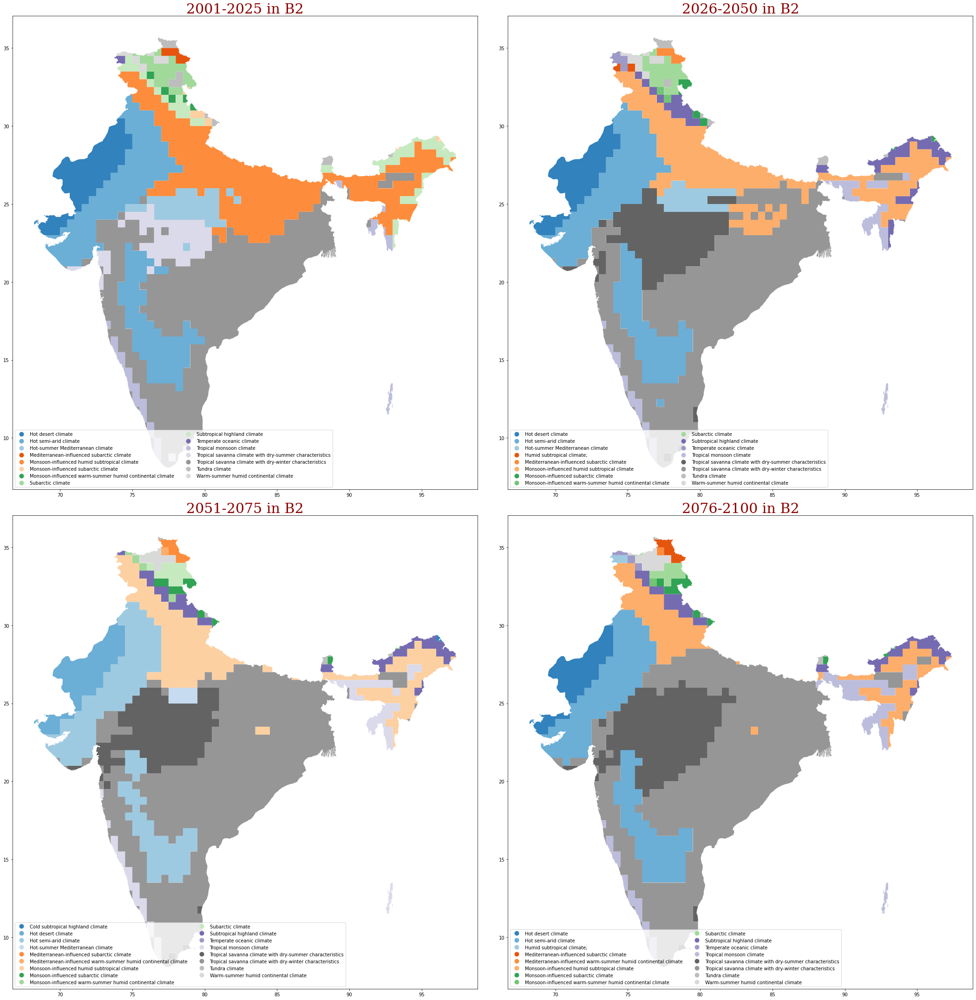

In [56]:
# creating a new list for observations geojson
b2_india = []
for i in b2_world:
  name, df = i
  temp = df.clip(boundary_df)
  temp = temp.reset_index(drop=True)
  b2_india.append((name, temp))

# plotting variations in observations
plot_shiftv(b2_india, 'lower left')

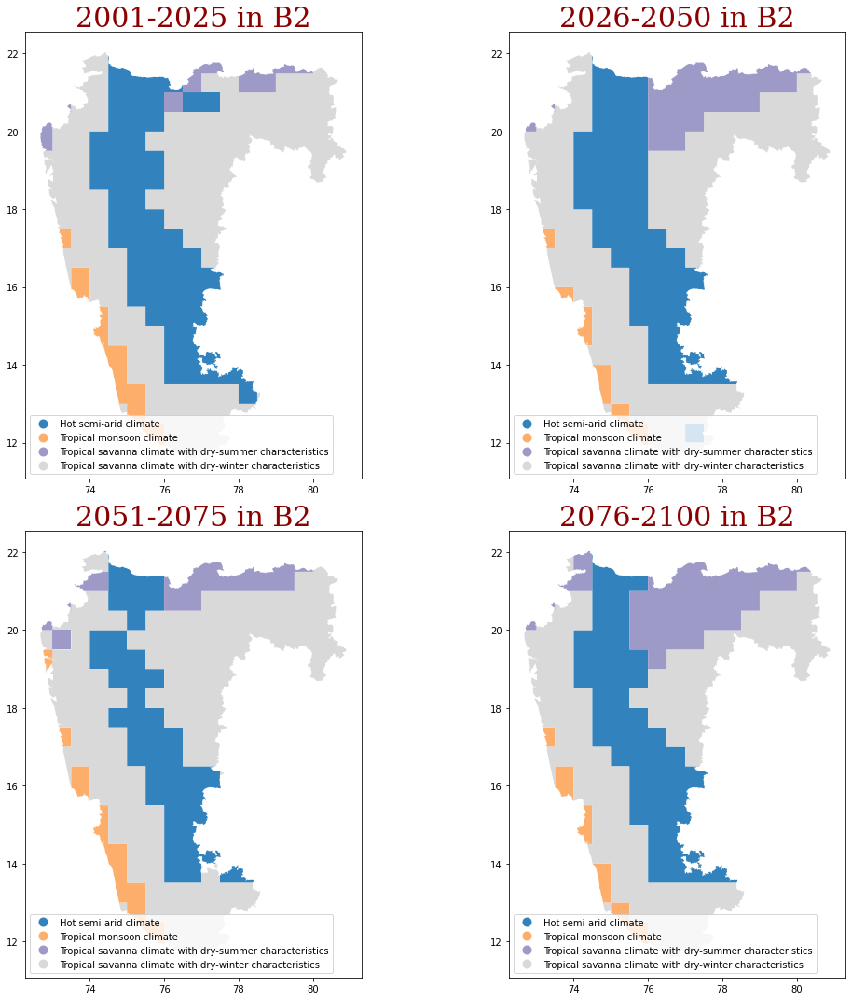

In [57]:
# creating a new list for observations geojson
b2_region = []
for i in b2_world:
  name, df = i
  temp = df.clip(regionsBoundary_df)
  temp = temp.reset_index(drop=True)
  b2_region.append((name, temp))

# plotting variations in observations
plot_shift_region(b2_region, 'lower left')

In [58]:
region_estudio = observations_region + a1f1_region + a2_region + b1_region + b2_region

In [59]:
# get area
def get_area(lista):
  nueva_lista = []
  for i in lista:
    name, df = i   
    df['area_km2'] = df.geometry.area / 1e-6
    nueva_lista.append((name, df))
  return nueva_lista

In [60]:
# calculate the are and compare
region_area = get_area(region_estudio)

# are calculation
region2 = pd.DataFrame(columns=['climate_shift','objectid', 'id', 'gridcode', 'shape_length', 'shape_area', 'geometry',
       'abb', 'koppen', 'area_km2'])
for i in region_area:
  name, df = i
  df['climate_shift'] = str(name)
  region2 = pd.concat([region2, df], ignore_index=True)

# subsetting the dataframe
region2 = region2[['climate_shift', 'abb', 'koppen', 'area_km2']].copy()

# groupby year
area_change_region = region2.groupby(['climate_shift', 'abb', 'koppen']).agg('sum').reset_index()

# dataframe for plotting
climates_abb_region = area_change_region.abb.value_counts().index.to_list() # 18 graphs

C:\Users\shubh\AppData\Local\Temp\ipykernel_24280\1680959901.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df['area_km2'] = df.geometry.area / 1e-6
C:\Users\shubh\AppData\Local\Temp\ipykernel_24280\1680959901.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df['area_km2'] = df.geometry.area / 1e-6
C:\Users\shubh\AppData\Local\Temp\ipykernel_24280\1680959901.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df['area_km2'] = df.geometry.area / 1e-6
C:\Users\shubh\AppData\Local\Temp\ipykernel_24280\1680959901.py:6: UserWarning: Geometry is in a geographic CRS. Results from '

In [61]:
def shift_print(df, clima, region):
  ob= ['1901-1925', '1926-1950', '1951-1975', '1976-2000']
  af= ['2001-2025_A1F1', '2026-2050_A1F1', '2051-2075_A1F1', '2076-2100_A1F1']
  a2= ['2001-2025_A2', '2026-2050_A2', '2051-2075_A2', '2076-2100_A2']
  b1= ['2001-2025_B1', '2026-2050_B1', '2051-2075_B1', '2076-2100_B1']
  b2= ['2001-2025_B2', '2026-2050_B2', '2051-2075_B2', '2076-2100_B2']

  temp = df.loc[df.abb == clima].reset_index(drop=True)

  fig, ax = plt.subplots(1,4,figsize = (30, 8), facecolor='w', edgecolor='k')
  af = temp.loc[temp['climate_shift'].isin(ob + af)]
  sns.barplot(data= af, y = 'climate_shift', x = 'area_km2', ax=ax[0])
  ax[0].set_title('')
  a2 = temp.loc[temp['climate_shift'].isin(ob + a2)]
  sns.barplot(data= a2, y = 'climate_shift', x = 'area_km2', ax=ax[1])
  ax[1].set_title('')
  b1 = temp.loc[temp['climate_shift'].isin(ob + b1)]
  sns.barplot(data= b1, y = 'climate_shift', x = 'area_km2', ax=ax[2])
  ax[2].set_title('')
  b2 = temp.loc[temp['climate_shift'].isin(ob + b2)]
  sns.barplot(data= b2, y = 'climate_shift', x = 'area_km2', ax=ax[3])
  ax[3].set_title('')

  fig.suptitle('Analysis for Climate: ' + str(clima) + ' in ' + str(region), fontsize=30)
  plt.tight_layout(rect=[0, 0.03, 1, 0.90])
  plt.show()

In [62]:
def shift_plot(df, clima, region):
  ob= ['1901-1925', '1926-1950', '1951-1975', '1976-2000']
  af= ['2001-2025_A1F1', '2026-2050_A1F1', '2051-2075_A1F1', '2076-2100_A1F1']
  a2= ['2001-2025_A2', '2026-2050_A2', '2051-2075_A2', '2076-2100_A2']
  b1= ['2001-2025_B1', '2026-2050_B1', '2051-2075_B1', '2076-2100_B1']
  b2= ['2001-2025_B2', '2026-2050_B2', '2051-2075_B2', '2076-2100_B2']

  # Dict for renaming
  afd= {'2001-2025_A1F1':'2001-2025', '2026-2050_A1F1':'2026-2050', 
        '2051-2075_A1F1':'2051-2075', '2076-2100_A1F1':'2076-2100'}
  a2d= {'2001-2025_A2':'2001-2025', '2026-2050_A2':'2026-2050',
        '2051-2075_A2':'2051-2075', '2076-2100_A2':'2076-2100'}
  b1d= {'2001-2025_B1':'2001-2025', '2026-2050_B1':'2026-2050',
        '2051-2075_B1':'2051-2075', '2076-2100_B1':'2076-2100'}
  b2d= {'2001-2025_B2':'2001-2025', '2026-2050_B2':'2026-2050', 
        '2051-2075_B2':'2051-2075', '2076-2100_B2':'2076-2100'}

  temp = df.loc[df.abb == clima].reset_index(drop=True)

  fig, ax = plt.subplots(figsize = (10, 5), facecolor='w', edgecolor='k')

  af = temp.loc[temp['climate_shift'].isin(ob + af)].copy()
  af.climate_shift.replace(afd, inplace=True)
  plt.plot('climate_shift', 'area_km2',  data= af, label='A1F1')

  a2 = temp.loc[temp['climate_shift'].isin(ob + a2)].copy()
  a2.climate_shift.replace(a2d, inplace=True)
  plt.plot('climate_shift', 'area_km2',  data= a2, label='A2')
  
  b1 = temp.loc[temp['climate_shift'].isin(ob + b1)].copy()
  b1.climate_shift.replace(b1d, inplace=True)
  plt.plot('climate_shift', 'area_km2',  data= b1, label='B1')

  b2 = temp.loc[temp['climate_shift'].isin(ob + b2)].copy()
  b2.climate_shift.replace(b2d, inplace=True)
  plt.plot('climate_shift', 'area_km2',  data= b2, label='B2')

  fig.suptitle('Analysis for Climate: ' + str(clima) + ' in ' + str(region), fontsize=30)
  ax.legend()
  plt.xticks(rotation=75)
  plt.tight_layout(rect=[0, 0.03, 1, 0.90])
  plt.show()

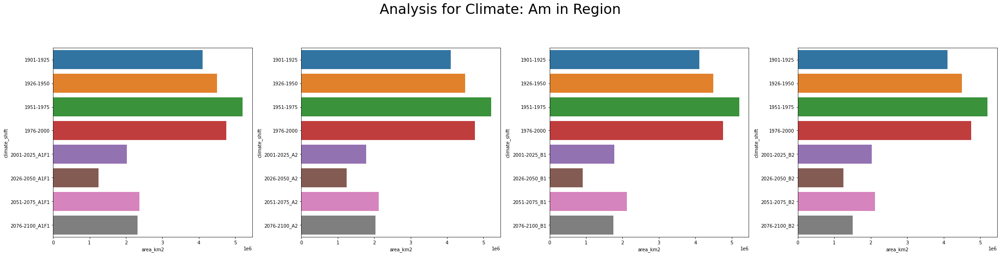

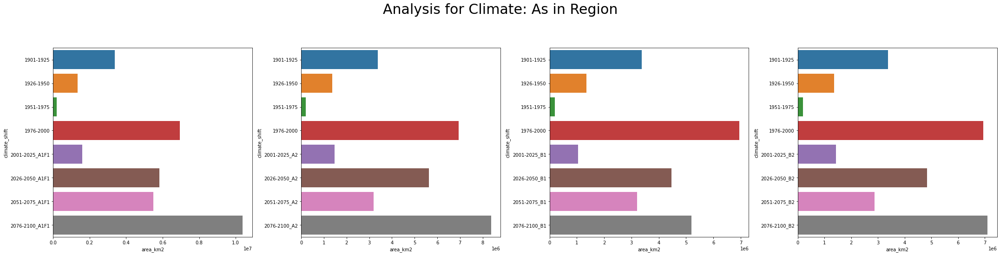

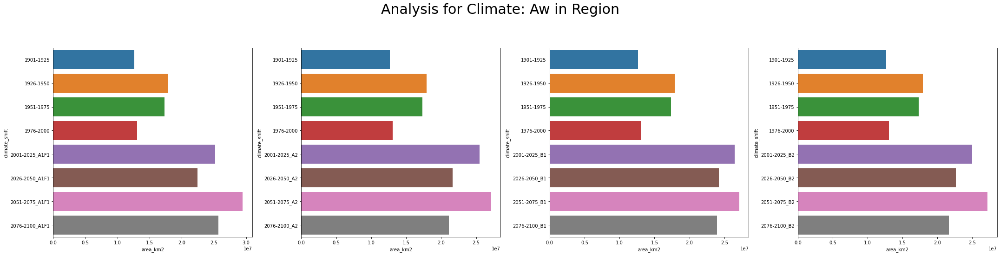

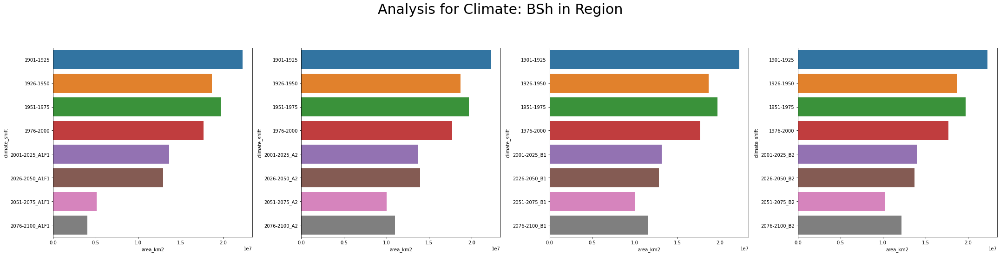

In [63]:
for i in climates_abb_region[:4]:
  shift_print(area_change_region, i, 'Region')
  print()

In [64]:
'Am' : 'Tropical monsoon climate',
'As' : 'Tropical savanna climate with dry-summer characteristics', 
'Aw' : 'Tropical savanna climate with dry-winter characteristics', 
'BSh' : 'Hot semi-arid climate', 

SyntaxError: illegal target for annotation (2851841601.py, line 1)

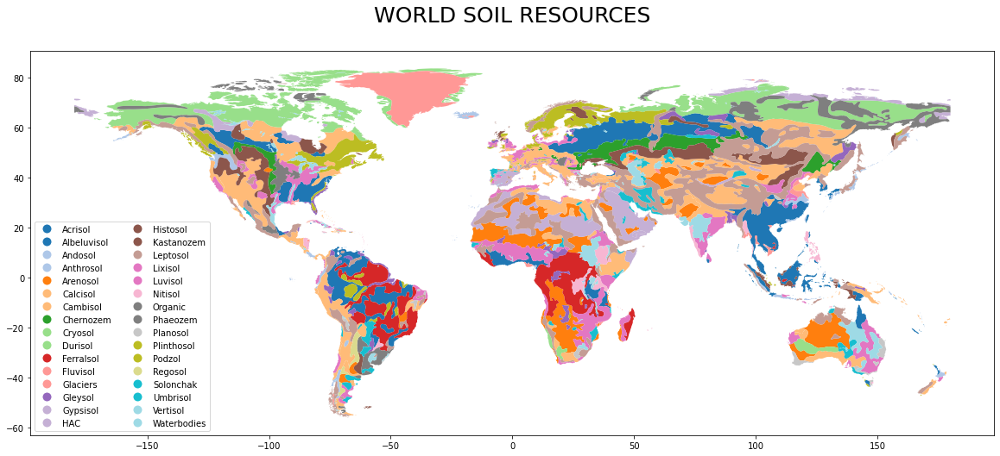

In [65]:
# plotting the map
ax = soil_df.plot(figsize = (20,10), column = 'ipcc', cmap='tab20', legend= True, 
                  legend_kwds={'loc': 'lower left', 'ncol': 2})
ax.set_title('WORLD SOIL RESOURCES\n', fontsize=25)
plt.show()

In [66]:
# Using geopandas to clip soil_df in the shape of asia_df
asiaSoil_df = soil_df.clip(asia_df)
aisaSoil_df= asiaSoil_df.reset_index(drop=True) # removing index

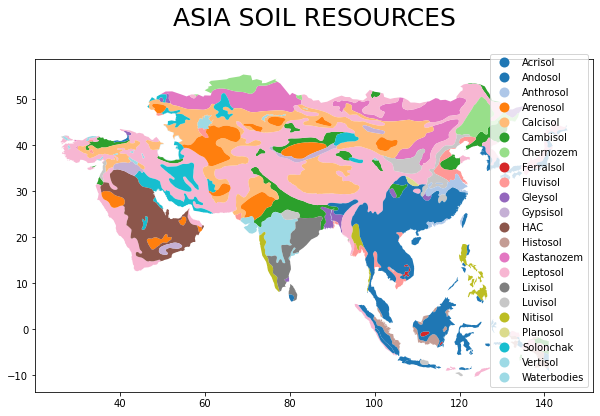

In [67]:
# plotting the map
ax = asiaSoil_df.plot(figsize = (10,15), column = 'ipcc', cmap='tab20', legend= True, 
                  legend_kwds={'loc': 'lower right'})
ax.set_title('ASIA SOIL RESOURCES\n', fontsize=25)
plt.show()

In [68]:
# India Soil resources
indiaSoil1 = 'https://datasets.mojaglobal.workers.dev/0:/Soil/World%20Soil%20Resources/byCountry/IND_AL2_India_WSR.json'

# download the data with request
indiaSoil1_req = requests.get(indiaSoil1).content

# load the json with geopandas
indiaSoil_df = gpd.read_file(io.StringIO(indiaSoil1_req.decode('utf-8')))

# fix the georeference the map seems to be cliped from a bad reference
indiaSoil_df.to_crs(5389, inplace=True)
indiaSoil_df.to_crs(4326, inplace=True) # now is WGS84

# fixing the data
# standardizing column names
indiaSoil_df.columns = indiaSoil_df.columns.str.lower()

# drop useless columns
indiaSoil_df = indiaSoil_df[['sname', 'ipcc', 'geometry']]

print('Indian Soil resources dataset has %2d rows and %2d columns' %(indiaSoil_df.shape[0], indiaSoil_df.shape[1]))

Indian Soil resources dataset has 12 rows and  3 columns


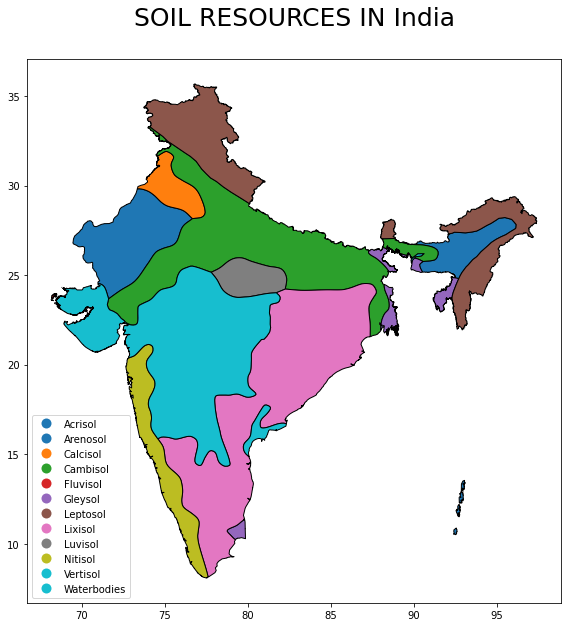

In [69]:
# plotting the map
ax = indiaSoil_df.plot(figsize = (20,10), column = 'ipcc',
                  edgecolor='black', cmap='tab10', legend= True, 
                  legend_kwds= {'loc': 'lower left'})
ax.set_title('SOIL RESOURCES IN India\n', fontsize=25)
plt.show()

In [70]:
# state dataset
mh2 = 'https://datasets.mojaglobal.workers.dev/0:/Soil/World%20Soil%20Resources/byStateWSR/IND/IND_AL4_Maharashtra_WSR.json'
kn2 = 'https://datasets.mojaglobal.workers.dev/0:/Soil/World%20Soil%20Resources/byStateWSR/IND/IND_AL4_Karnataka_WSR.json'

# download the data with request
mh2_req = requests.get(mh2).content
kn2_req = requests.get(kn2).content

# load the json with geopandas and set_crs
mhSoil_df = gpd.read_file(io.StringIO(mh2_req.decode('utf-8')))
knSoil_df = gpd.read_file(io.StringIO(kn2_req.decode('utf-8')))

# fix the georeference! the map seems to be cliped from a bad reference
mhSoil_df.to_crs(5389, inplace=True)
mhSoil_df.to_crs(4326, inplace=True) 
knSoil_df.to_crs(5389, inplace=True)
knSoil_df.to_crs(4326, inplace=True)

# fixing the data
# standardizing column names
knSoil_df.columns = knSoil_df.columns.str.lower()
mhSoil_df.columns = mhSoil_df.columns.str.lower()

# drop useless columns
mhSoil_df = mhSoil_df[['sname', 'ipcc', 'geometry']]
knSoil_df = knSoil_df[['sname', 'ipcc', 'geometry']]

print('Maharashtra\'s Soil dataset has %2d rows and %2d columns' %(mhSoil_df.shape[0], mhSoil_df.shape[1]))
print('Karnataka Soil\'s dataset has %2d rows and %2d columns' %(knSoil_df.shape[0], knSoil_df.shape[1]))

Maharashtra's Soil dataset has  3 rows and  3 columns
Karnataka Soil's dataset has  3 rows and  3 columns


In [71]:
# Using pandas to concatenate the dataframes.
regionsSoil_df = pd.concat([mhSoil_df, knSoil_df], ignore_index=True)

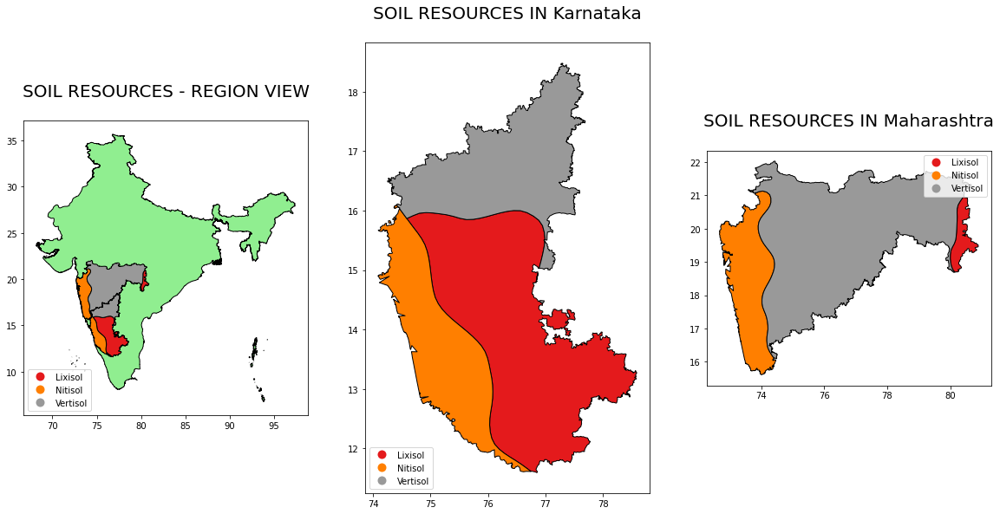

In [72]:
# Plotting in the maps
fig, axes = plt.subplots(1,3, figsize=(20,50))

# first map axes[0]
axes[0].set_title('SOIL RESOURCES - REGION VIEW\n', fontsize=20)
boundary_df.plot(ax=axes[0], color='lightgreen', edgecolor='black')
regionsSoil_df.plot(ax=axes[0], column='ipcc', cmap='Set1', edgecolor='black',
                    legend=True, legend_kwds={'loc': 'lower left'})

# second map axes[1]
axes[1].set_title('SOIL RESOURCES IN Karnataka\n', fontsize=20)
knSoil_df.plot(ax=axes[1], column='ipcc', cmap='Set1', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'lower left'})

# third map axes[2]
axes[2].set_title('SOIL RESOURCES IN Maharashtra\n', fontsize=20)
mhSoil_df.plot(ax=axes[2], column='ipcc', cmap='Set1', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'upper right'})

plt.show()

In [73]:
# Biodiversity Hotspots dataset
bioHot = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/CI_BiodiversityHotspots.geojson'

# download the data with request
bioHot_req = requests.get(bioHot).content

# load the json with geopandas
bioHot_df = gpd.read_file(io.StringIO(bioHot_req.decode('utf-8')))
bioHot_df.set_crs(epsg=4326, inplace=True)

# fixing the data: standardizing column names
bioHot_df.columns = bioHot_df.columns.str.lower()

print('The Biodiversity Hotspots dataset has %2d rows and %2d columns' %(bioHot_df.shape[0], bioHot_df.shape[1]))

The Biodiversity Hotspots dataset has 53 rows and  6 columns


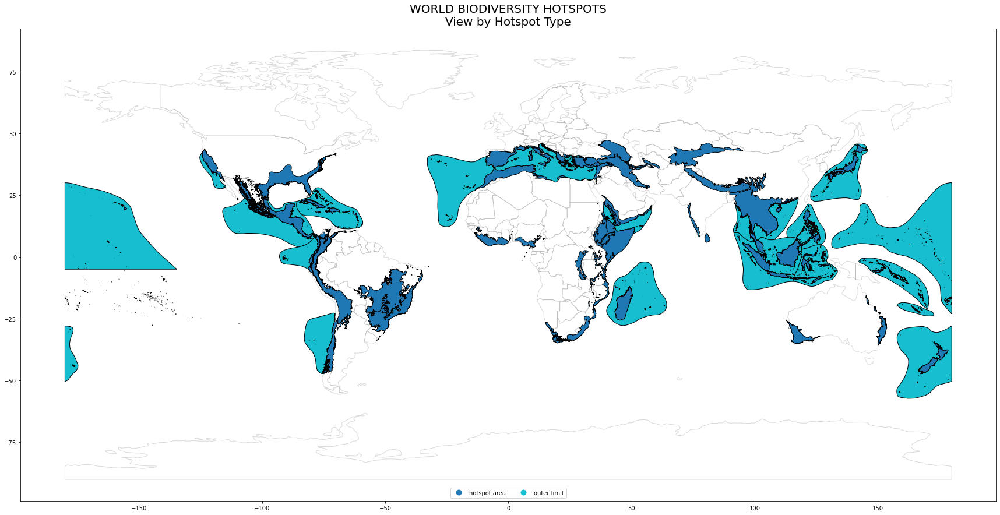

In [74]:
# Plotting the map
ax = world_df.plot(figsize=(30,15), color='none', edgecolor='grey', alpha=0.3)
bioHot_df.plot(ax = ax, column= 'type', cmap= 'tab10', edgecolor= 'black', legend= True, 
                   legend_kwds={'loc': 'lower center', 'ncol': 2})
ax.set_title('WORLD BIODIVERSITY HOTSPOTS\nView by Hotspot Type', fontsize=20)
plt.show()

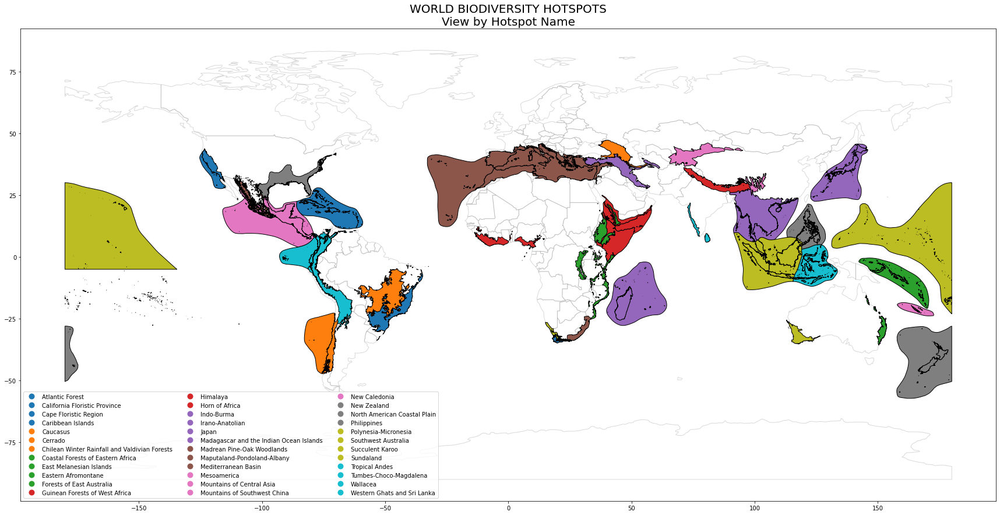

In [75]:
# Plotting the map
ax = world_df.plot(figsize=(30,15), color='none', edgecolor='grey', alpha=0.3)
bioHot_df.plot(ax = ax, column= 'name', cmap= 'tab10', edgecolor= 'black', legend= True, 
                   legend_kwds={'loc': 'lower left', 'ncol': 3})
ax.set_title('WORLD BIODIVERSITY HOTSPOTS\nView by Hotspot Name', fontsize=20)
plt.show()

In [76]:
# creating dataframe
asiaBioHot_df = bioHot_df.clip(asia_df)
asiaBioHot_df = asiaBioHot_df.reset_index(drop=True)

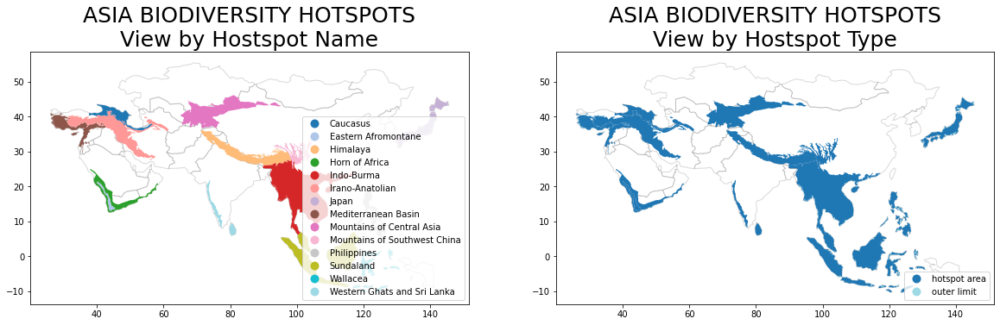

In [77]:
# Plotting in the maps
fig, axes = plt.subplots(1,2, figsize=(20,50))

# first map axes[0]
axes[0].set_title('ASIA BIODIVERSITY HOTSPOTS\nView by Hostspot Name', fontsize=25)
asia_df.plot(ax=axes[0], color='none', edgecolor='grey', alpha=0.3)
asiaBioHot_df.plot(ax=axes[0], column = 'name', cmap='tab20', legend= True, 
                  legend_kwds={'loc': 'lower right'})

# second map axes[1]
axes[1].set_title('ASIA BIODIVERSITY HOTSPOTS\nView by Hostspot Type', fontsize=25)
asia_df.plot(ax=axes[1], color='none', edgecolor='grey', alpha=0.3)
asiaBioHot_df.plot(ax=axes[1], column = 'type', cmap='tab20', legend= True, 
                  legend_kwds={'loc': 'lower right'})

plt.show()

In [78]:
# creating dataframe
indiaBioHot_df= bioHot_df.clip(boundary_df)
indiaBioHot_df = indiaBioHot_df.reset_index(drop=True)

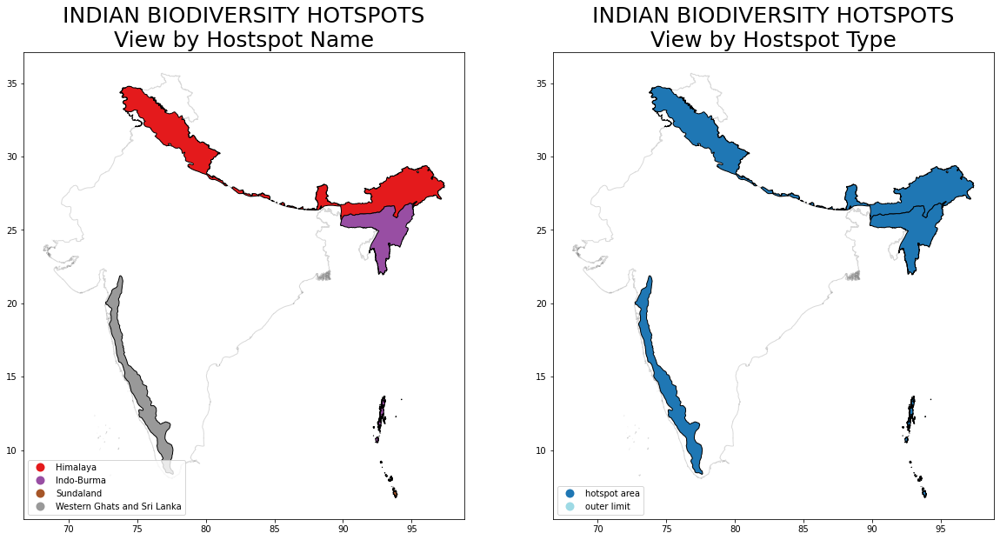

In [79]:
# Plotting in the maps
fig, axes = plt.subplots(1,2, figsize=(20,50))

# first map axes[0]
axes[0].set_title('INDIAN BIODIVERSITY HOTSPOTS\nView by Hostspot Name', fontsize=25)
boundary_df.plot(ax=axes[0], color='none', edgecolor='grey', alpha=0.3)
indiaBioHot_df.plot(ax=axes[0], column = 'name', cmap='Set1', edgecolor='black', legend= True, 
                  legend_kwds={'loc': 'lower left'})

# second map axes[1]
axes[1].set_title('INDIAN BIODIVERSITY HOTSPOTS\nView by Hostspot Type', fontsize=25)
boundary_df.plot(ax=axes[1], color='none', edgecolor='grey', alpha=0.3)
indiaBioHot_df.plot(ax=axes[1], column = 'type', cmap='tab20', edgecolor='black', legend= True, 
                  legend_kwds={'loc': 'lower left'})

plt.show()

In [80]:
knBioHot_df = bioHot_df.clip(knBoundary_df)
knBioHot_df = knBioHot_df.reset_index(drop=True)
mhBioHot_df = bioHot_df.clip(mhBoundary_df)
mhBioHot_df = mhBioHot_df.reset_index(drop=True)

In [81]:
# Using pandas to concatenate the dataframes.
regionsBioHot_df = pd.concat([mhBioHot_df, knBioHot_df], ignore_index=True)

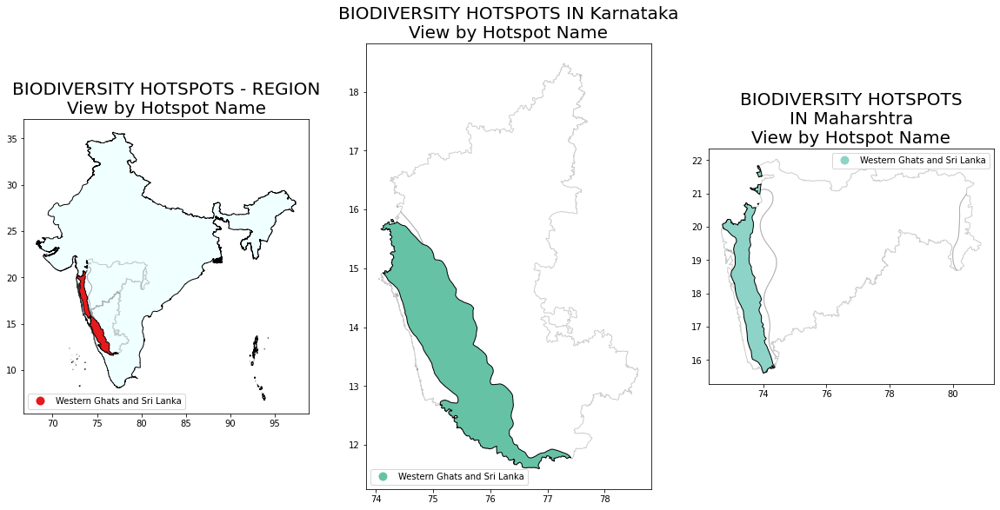

In [82]:
# Plotting in the maps
fig, axes = plt.subplots(1,3, figsize=(20,50))

# first map axes[0]
axes[0].set_title('BIODIVERSITY HOTSPOTS - REGION\nView by Hotspot Name', fontsize=20)
boundary_df.plot(ax=axes[0], color='azure', edgecolor='black')
regionsBoundary_df.plot(ax=axes[0], color='none', edgecolor='grey',  alpha=0.4)
regionsBioHot_df.plot(ax=axes[0], column='name', cmap='Set1', edgecolor='black',
                    legend=True, legend_kwds={'loc': 'lower left'})

# second map axes[1]
axes[1].set_title('BIODIVERSITY HOTSPOTS IN Karnataka\nView by Hotspot Name', fontsize=20)
knBoundary_df.plot(ax=axes[1], color='none', edgecolor='grey',  alpha=0.4)
knBioHot_df.plot(ax=axes[1], column='name', cmap='Set2', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'lower left'})

# third map axes[2]
axes[2].set_title('BIODIVERSITY HOTSPOTS\nIN Maharshtra\nView by Hotspot Name', fontsize=20)
mhBoundary_df.plot(ax=axes[2], color='none', edgecolor='grey',  alpha=0.4)
mhBioHot_df.plot(ax=axes[2], column='name', cmap='Set3', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'upper right'})

plt.show()

In [83]:
# Bioclimatic and Ecological Zones dataset
bioEco = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/Global_Ecological_Zone_GEZ/GlobalEcologicalZone_GEZFAO2010.json'

# download the data with request
bioEco_req = requests.get(bioEco).content

# load the json with geopandas
bioEco_df = gpd.read_file(io.StringIO(bioEco_req.decode('utf-8')))
bioEco_df.set_crs(epsg=4326, inplace=True)

# fixing the data: standardizing column names
bioEco_df.columns = bioEco_df.columns.str.lower()

print('The Bioclimatic and Ecological Zones dataset has %2d rows and %2d columns' %(bioEco_df.shape[0], bioEco_df.shape[1]))

The Bioclimatic and Ecological Zones dataset has 16 rows and  4 columns


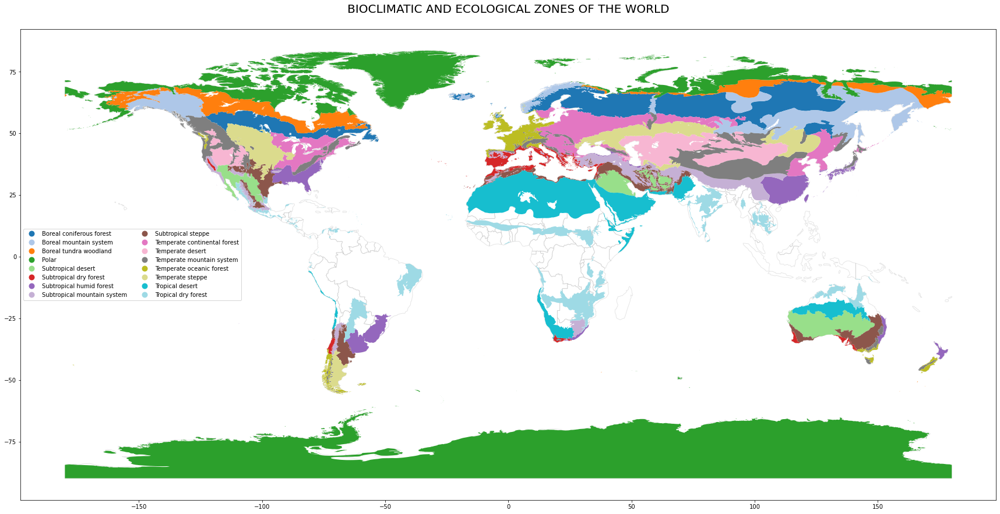

In [84]:
# Plotting the map
ax = world_df.plot(figsize=(30,15), color='none', edgecolor='grey', alpha=0.2)
bioEco_df.plot(ax =ax, column= 'gez_name', cmap= 'tab20', legend= True, 
                  legend_kwds={'loc': 'center left', 'ncol': 2})
ax.set_title('BIOCLIMATIC AND ECOLOGICAL ZONES OF THE WORLD\n', fontsize=20)
plt.show()

In [ ]:
# creating dataframe
asiabioEco_df = bioEco_df.clip(asia_df)
asiabioEco_df = asiabioEco_df.reset_index(drop=True)

In [ ]:
# Plotting in the maps
ax = asia_df.plot(figsize=(10,15), color='none', edgecolor='grey', alpha=0.3)
asiabioEco_df.plot(ax=ax, column = 'gez_name', cmap='tab20', legend= True, 
                  legend_kwds={'loc': 'lower right'})
ax.set_title('BIOCLIMATIC AND ECOLOGICAL ZONES\nOF ASIA', fontsize=25)

plt.show()

In [ ]:
# Indian dataset
indiabioEco = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/Global_Ecological_Zone_GEZ/byCountry/IND_AL2_India_GEZ.json'

# download the data with request
indiabioEco_req = requests.get(indiabioEco).content

# load the json with geopandas
indiabioEco_df = gpd.read_file(io.StringIO(indiabioEco_req.decode('utf-8')))

# fix the georeference! the map seems to be cliped from a bad reference
indiabioEco_df.to_crs(5389, inplace=True)
indiabioEco_df.to_crs(4326, inplace=True)

# fixing the data: standardizing column names
bioEco_df.columns = bioEco_df.columns.str.lower()

print('indian Bioclimatic an Ecological Zones has %2d rows and %2d columns' %(indiabioEco_df.shape[0], indiabioEco_df.shape[1]))

In [ ]:
# plotting the map
ax = indiabioEco_df.plot(figsize = (10,15), column = 'gez_name',
                  edgecolor='black', cmap='tab20', legend= True, 
                  legend_kwds= {'loc': 'lower left'})
ax.set_title('BIOCLIMATIC AND ECOLOGICAL ZONES\nOF INDIA', fontsize=20)
plt.show()

In [ ]:
# Peruvian 'Departamentos' choosed for review: kn and Madre de Dios.

# state (Departamento) dataset
mhBioEco = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/Global_Ecological_Zone_GEZ/byStateGEZ/IND/IND_AL4_Maharashtra_GEZ.json'
knBioEco = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/Global_Ecological_Zone_GEZ/byStateGEZ/IND/IND_AL4_Karnataka_GEZ.json'

# download the data with request
mhBioEco_req = requests.get(mhBioEco).content
knBioEco_req = requests.get(knBioEco).content

# load the json with geopandas and set crs
mhBioEco_df = gpd.read_file(io.StringIO(mhBioEco_req.decode('utf-8')))
knBioEco_df = gpd.read_file(io.StringIO(knBioEco_req.decode('utf-8')))

# fix the georeference! the map seems to be cliped from a bad reference
mhBioEco_df.to_crs(5389, inplace=True)
mhBioEco_df.to_crs(4326, inplace=True)
knBioEco_df.to_crs(5389, inplace=True)
knBioEco_df.to_crs(4326, inplace=True)

# fixing the data, standardizing column names
knBioEco_df.columns = knBioEco_df.columns.str.lower()
mhBioEco_df.columns = mhBioEco_df.columns.str.lower()

print('Maharashtra dataset has %2d rows and %2d columns' %(mhBioEco_df.shape[0], mhBioEco_df.shape[1]))
print('Karnataka dataset has %2d rows and %2d columns' %(knBioEco_df.shape[0], knBioEco_df.shape[1]))

In [ ]:
# Using pandas to concatenate the dataframes.
regionsEcoHot_df = pd.concat([mhBioEco_df, knBioEco_df], ignore_index=True)

In [ ]:
# Plotting in the maps
fig, axes = plt.subplots(1,3, figsize=(20,50))

# first map axes[0]
axes[0].set_title('BIOCLIMATIC AND ECOLOGICAL\nZONES OF India\n', fontsize=20)
boundary_df.plot(ax=axes[0], color='azure', edgecolor='black')
regionsEcoHot_df.plot(ax=axes[0], column='gez_name', cmap='tab20', 
                         edgecolor= 'black', legend=True, legend_kwds={'loc': 'lower left'})

# second map axes[1]
axes[1].set_title('BIOCLIMATIC AND ECOLOGICAL\n Karnataka\n', fontsize=20)
knBioEco_df.plot(ax=axes[1], column='gez_name', cmap='tab20', 
                         edgecolor= 'black', legend=True, legend_kwds={'loc': 'lower left'})

# third map axes[2]
axes[2].set_title('BIOCLIMATIC AND ECOLOGICAL\nZONES OF Mahrashtra\n', fontsize=20)
mhBioEco_df.plot(ax=axes[2], column='gez_name', cmap='tab20', 
                         edgecolor= 'black', legend=True, legend_kwds={'loc': 'best'})

plt.show()

In [ ]:
#Global Holdridge Life Zones

In [ ]:
# All Soil resources dataset
holdrigde = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/HoldridgeLifeZones.json'

# download the data with request
holdrigde_req = requests.get(holdrigde).content

# load the json with geopandas and set crs
holdrigde_df = gpd.read_file(io.StringIO(holdrigde_req.decode('utf-8')))
holdrigde_df.set_crs(epsg=4326, inplace=True)

# fixing the data
# standardizing column names
holdrigde_df.columns = holdrigde_df.columns.str.lower()

# removing useles columns or empty labels
holdrigde_df = holdrigde_df.loc[holdrigde_df.desc != ' '] # remove oceans
holdrigde_df = holdrigde_df[['desc', 'geometry','frequency', 'area', 'perimeter']]

print('Global Soil resources dataset has %2d rows and %2d columns.' %(holdrigde_df.shape[0], holdrigde_df.shape[1]))

In [ ]:
# Plotting in the maps
ax = holdrigde_df.plot(figsize= (30,15), column='desc', edgecolor='black', cmap='tab20c',
             legend=True, legend_kwds={'loc': 'lower left', 'ncol':2})
ax.set_title('WORLD HOLDRIDGE LIFE ZONES\n', fontsize=25)
plt.show()

In [ ]:
# creating dataframe
asiaHoldridge_df = holdrigde_df.clip(asia_df)
asiaHoldridge_df = asiaHoldridge_df.reset_index(drop=True)

In [ ]:
# Plotting in the maps
ax = asiaHoldridge_df.plot(figsize=(20,15), column = 'desc', edgecolor='black', cmap='tab20c',
                                    legend= True, legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)})
ax.set_title('HOLDRIDGE LIFE ZONES\nOF ASIA', fontsize=25)
plt.show()

In [ ]:
# creating dataframe
indiaHoldridge_df = holdrigde_df.clip(boundary_df)
indiaHoldridge_df = indiaHoldridge_df.reset_index(drop=True)

In [ ]:
# Plotting in the maps
ax = indiaHoldridge_df.plot(figsize=(10,15), column = 'desc', edgecolor='black', cmap='tab20c',
                                    legend= True, legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)})
ax.set_title('HOLDRIDGE LIFE ZONES\nOF India', fontsize=25)
plt.show()

In [ ]:
# creating dataframe
mhHoldridge_df = holdrigde_df.clip(mhBoundary_df)
mhHoldridge_df = mhHoldridge_df.reset_index(drop=True)
knHoldridge_df = holdrigde_df.clip(knBoundary_df)
knHoldridge_df = knHoldridge_df.reset_index(drop=True)

In [ ]:
# Using pandas to concatenate the dataframes.
regionsHoldridge_df = pd.concat([mhHoldridge_df, knHoldridge_df], ignore_index=True)

In [ ]:
# Plotting in the maps
fig, axes = plt.subplots(1,3, figsize=(35,20))

# first map axes[0]
axes[0].set_title('HOLDRIDGE LIFE ZONES - REGION\n', fontsize=20)
boundary_df.plot(ax=axes[0], color='azure', edgecolor='black')
regionsHoldridge_df.plot(ax=axes[0], column='desc', cmap='Set1', edgecolor='black',
                    legend=True, legend_kwds={'loc': 'lower left'})

# second map axes[1]
axes[1].set_title('HOLDRIDGE LIFE ZONES\nOF Karntaka', fontsize=20)
knHoldridge_df.plot(ax=axes[1], column='desc', cmap='Set2', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'lower left'})

# third map axes[2]
axes[2].set_title('HOLDRIDGE LIFE ZONES\nIN Mahrashtra', fontsize=20)
mhHoldridge_df.plot(ax=axes[2], column='desc', cmap='Set3', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'upper right'})
plt.show()

In [ ]:
#Agro Ecological Zones

In [ ]:
# All Agro Ecological Zones dataset
agroEco = 'https://datasets.mojaglobal.workers.dev/0:/Bioclimatic&EcologicalZones/GAEZ_Global_AgroEcological_Zones/GlobalAgroEcologicalZones_GAEZ.geojson'

# download the data with request
agroEco_req = requests.get(agroEco).content

# load the json with geopandas
agroEco_df = gpd.read_file(io.StringIO(agroEco_req.decode('utf-8')))
agroEco_df.set_crs(epsg=4326, inplace=True)

print('Global Agro Ecological Zones dataset has %2d rows and %2d columns.' %(agroEco_df.shape[0], agroEco_df.shape[1]))

In [ ]:
# fixing the data
values = {'1': 'Wheat', '2': 'Rice', '3': 'Maize', '4': 'Sorghum', '5': 'Millet', 
          '6': 'Other cereals', '7': 'Tubers', '8': 'Roots', '9': 'Sugar beet', 
          '10': 'Sugarcane', '11': 'Pulses', '12': 'Soybean', '13': 'Rape', 
          '14': 'Sunflower', '15': 'Groundnut', '16': 'Oil Palm', '17': 'Olive', 
          '18': 'Cotton', '19': 'Cash 1', '20': 'Vegetables', '21': 'Cash 2', 
          '22': 'Fodder', '23': 'Residual'}

# standardizing column names
agroEco_df.columns = agroEco_df.columns.str.lower()

# renaming class_name
agroEco_df.value = agroEco_df.value.astype('str').replace(values)

In [ ]:
# plotting the map
ax = agroEco_df.plot(figsize = (30,15), column = 'value',
                     legend= True, legend_kwds= {'loc': 'lower left'})
ax.set_title('WORLD AGROECOLOGICAL ZONES MAP\n', fontsize=25)
plt.show()

In [ ]:
# creating dataframe
asiaagroEco_df = agroEco_df.clip(asia_df)
asiaagroEco_df = asiaagroEco_df.reset_index(drop=True)

In [ ]:
# Plotting in the maps
ax = asiaagroEco_df.plot(figsize=(10,15), edgecolor='black', column = 'value', cmap='tab10',
                                    legend= True, legend_kwds={'loc': 'lower right'})
ax.set_title('AGROECOLOGICAL ZONES\nOF ASIA', fontsize=25)
plt.show()

In [ ]:
# creating dataframe
indiaagroEco_df = agroEco_df.clip(boundary_df)
indiaagroEco_df = indiaagroEco_df.reset_index(drop=True)

In [ ]:
# Plotting in the maps
ax = indiaagroEco_df.plot(figsize=(10,15), edgecolor='black', column = 'value', cmap='tab10',
                                    legend= True, legend_kwds={'loc': 'lower left'})
ax.set_title('AGROECOLOGICAL ZONES\nOF Inida', fontsize=25)
plt.show()

In [ ]:
# creating dataframe
knagroEco_df = agroEco_df.clip(knBoundary_df)
knagroEco_df = knagroEco_df.reset_index(drop=True)
mhagroEco_df = agroEco_df.clip(mhBoundary_df)
mhagroEco_df = mhagroEco_df.reset_index(drop=True)

In [ ]:
# Using pandas to concatenate the dataframes.
regionsagroEco_df = pd.concat([mhagroEco_df, knagroEco_df], ignore_index=True)

In [ ]:
# Plotting in the maps
fig, axes = plt.subplots(1,3, figsize=(35,20))

# first map axes[0]
axes[0].set_title('AGROECOLOGICAL ZONES - REGION\n', fontsize=20)
boundary_df.plot(ax=axes[0], color='azure', edgecolor='black')
regionsagroEco_df.plot(ax=axes[0], column='value', cmap='Set3', edgecolor='black',
                    legend=True, legend_kwds={'loc': 'lower left'})

# second map axes[1]
axes[1].set_title('AGROECOLOGICAL ZONES\nOF Karnataka', fontsize=20)
knagroEco_df.plot(ax=axes[1], column='value', cmap='Set3', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'lower left'})

# third map axes[2]
axes[2].set_title('AGROECOLOGICAL ZONES\nIN Maharashtra', fontsize=20)
mhagroEco_df.plot(ax=axes[2], column='value', cmap='Set3', edgecolor='black',
                  legend=True, legend_kwds={'loc': 'upper right'})
plt.show()

In [ ]:
# Climate Zones dataset
climate = 'https://datasets.mojaglobal.workers.dev/0:/Climate/IPCC_ClimateZoneMap_Vector.geojson'

# download the data with request
climate_req = requests.get(climate).content

# load the json with geopandas
climate_df = gpd.read_file(io.StringIO(climate_req.decode('utf-8')))
climate_df.set_crs(epsg=4326, inplace=True)

# standardizing column names
climate_df.columns = climate_df.columns.str.lower()

print('World Climate Zones dataset has %2d rows and %2d columns.' %(climate_df.shape[0], climate_df.shape[1]))

In [ ]:
# Replacing the data that was in codes
classification =  {'1': 'Tropical montane', '2' : 'Tropical wet', 
                   '3': 'Tropical moist', '4': 'Tropical dry', 
                   '5': 'Warm temperate moist', '6': 'Warm temperate dry',
                   '7': 'Cool temperate moist', '8': 'Cool temperate dry',
                   '9': 'Boreal moist', '10': 'Boreal dry', '11' : 'Polar moist',
                   '12': 'Polar dry'}


# renaming class_name
climate_df.class_name = climate_df.class_name.astype('str').replace(classification)

# removing oceans
climate_df =  climate_df.loc[climate_df.class_name != '0']

In [ ]:
# plotting the map
ax = climate_df.plot(figsize = (30,15), column = 'class_name', legend= True, 
                     legend_kwds= {'loc': 'lower left'})
ax.set_title('WORLD CLIMATE ZONE MAP\n', fontsize=25)
plt.show()

In [ ]:
# creating dataframe
asiaClimate_df = climate_df.clip(asia_df)
asiaClimate_df = asiaClimate_df.reset_index(drop=True)